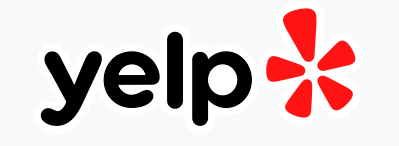

The Yelp Dataset is a valuable resource for academic research, teaching, and learning. It provides a rich collection of real-world data related to businesses, reviews, and user interactions. Here are the key details about the Yelp Dataset: Reviews: A whopping 6,990,280 reviews from users. Businesses: Information on 150,346 businesses. Pictures: A collection of 200,100 pictures. Metropolitan Areas: Data from 11 metropolitan areas. Tips: Over 908,915 tips provided by 1,987,897 users. Business Attributes: Details like hours, parking availability, and ambiance for more than 1.2 million businesses. Aggregated Check-ins: Historical check-in data for each of the 131,930 businesses.

https://paperswithcode.com/dataset/yelp

For their research, Stan Zwartkruis and Ziya Karaca, two MSc students at the Amsterdam University of Applied Sciences (AUAS) who were following the course "Digital Driven Business" during the study year 2023-2024, utilized a subset of this dataset. This subset consisted of 150,000 data points, selected from the various JSON files provided by the Yelp Dataset. These samples then underwent a categorization process, where the different types of businesses were grouped according to their categories.

The focal point of the research was to identify the most prominent category within the dataset. Through this analysis, it was found that 'restaurants' emerged as the largest category. Furthermore, the research honed in on the geographical distribution of these restaurant categories, identifying the most frequent state within the U.S. where these restaurants are located.

This approach allows for a more targeted analysis within the vast expanse of data provided by the Yelp Dataset.

## 1. Exploratory Data Analysis (EDA)

In [9]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib as pyplot
import os

In [10]:
# Show path 
os.getcwd()

'c:\\Users\\yunus\\Desktop\\MSc\\Digital Driven Business\\Subjects\\System Development for Marketing\\RecSys\\Yelp Dataset\\System-Development-for-Marketing'

Loading JSON files `df1`, `df2` and `df3` into a DataFrame

In [11]:
# Read df1
df1 = pd.read_json(r"yelp_academic_dataset_business.json", lines=True)

In [12]:
# Read df2
df2 = pd.read_json(r"yelp_academic_dataset_checkin.json", lines=True)

In [13]:
# Read df3
df3 = pd.read_json(r"yelp_academic_dataset_tip.json", lines=True)

1.1 The `.shape` attribute of a DataFrame `df1`, `df2` and `df3` provides the dimensions of the DataFrame, returning a tuple representing the number of rows followed by the number of columns

In [14]:
# Check df1 rows and column amounts
df1.shape

(150346, 14)

In [15]:
# Check df2 rows and column amounts
df2.shape

(131930, 2)

In [16]:
# Check df3 rows and column amounts
df3.shape

(908915, 5)

1.2 The `columns` of each DataFrame `df1`, `df2` & `df3`

In [17]:
# Check columns
df1.columns

Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')

In [18]:
# Check columns
df2.columns

Index(['business_id', 'date'], dtype='object')

In [19]:
# Check columns
df3.columns

Index(['user_id', 'business_id', 'text', 'date', 'compliment_count'], dtype='object')

1.3 We've used chunksize for the remaining 2 JSON files, because the 'user' and 'review' datasets are ~ 3.2GB and 5.2GB which both are huge

In [20]:
#chunk_size = 200000
#chunks = pd.read_json("yelp_academic_dataset_user.json", lines=True, chunksize=chunk_size)

#for i, chunk in enumerate(chunks):
#    print(f"Processing Chunk {i+1}...")

1.4 Show the 1th chunk only. No need to go through the other chunks

In [21]:
# chunk_size = 200000
# Create an iterator to read the JSON file in chunks of the specified size
# chunks = pd.read_json("yelp_academic_dataset_user.json", lines=True, chunksize=chunk_size)

# Retrieve the first chunk directly from the iterator
# first_chunk_df = next(chunks)

1.5 Using a loop to iterate through that picks the 2th chunk of `second_chunk_df4` & `second_chunk_df5`

In [22]:
chunk_size = 150000 # Determined the minimum rows
# Create an iterator to read the JSON file in chunks of the specified size
chunks = pd.read_json(r"yelp_academic_dataset_user.json", lines=True, chunksize=chunk_size)

# Initialize a variable to store the second chunk
second_chunk_df4 = None

# Loop through the chunks until the second one is reached
for i, chunk in enumerate(chunks, start=1):
    if i == 2:  # Check if it's the second chunk
        second_chunk_df4 = chunk
        break  # Exit the loop once the second chunk is found

In [23]:
chunk_size = 150000 # Determined the minimum rows
# Create an iterator to read the JSON file in chunks of the specified size
chunks = pd.read_json(r"yelp_academic_dataset_review.json", lines=True, chunksize=chunk_size)

# Initialize a variable to store the second chunk
second_chunk_df5 = None

# Loop through the chunks until the second one is reached
for i, chunk in enumerate(chunks, start=1):
    if i == 2:  # Check if it's the second chunk
        second_chunk_df5 = chunk
        break  # Exit the loop once the second chunk is found

1.6 The `columns` and `shape` of DataFrame `second_chunk_df4` & `second_chunk_df5`

In [24]:
# Check column
second_chunk_df4.columns

Index(['user_id', 'name', 'review_count', 'yelping_since', 'useful', 'funny',
       'cool', 'elite', 'friends', 'fans', 'average_stars', 'compliment_hot',
       'compliment_more', 'compliment_profile', 'compliment_cute',
       'compliment_list', 'compliment_note', 'compliment_plain',
       'compliment_cool', 'compliment_funny', 'compliment_writer',
       'compliment_photos'],
      dtype='object')

In [25]:
# Check rows and column amounts
second_chunk_df4.shape

(150000, 22)

In [26]:
# Check column names
second_chunk_df4.columns

Index(['user_id', 'name', 'review_count', 'yelping_since', 'useful', 'funny',
       'cool', 'elite', 'friends', 'fans', 'average_stars', 'compliment_hot',
       'compliment_more', 'compliment_profile', 'compliment_cute',
       'compliment_list', 'compliment_note', 'compliment_plain',
       'compliment_cool', 'compliment_funny', 'compliment_writer',
       'compliment_photos'],
      dtype='object')

In [27]:
# Check rows and column amounts
second_chunk_df5.shape

(150000, 9)

1.7 Limit the maximum width of each feature (columns) to 50 characters and the maximum number of features (columns) to 10

In [28]:
# Set maximum width of each feature to 50 characters, you can adjust this as needed
pd.set_option('display.max_colwidth', 50)

# If you also want to limit the number of features displayed you can use:
pd.set_option('display.max_columns', 10)

1.8 Display each DataFrame `df1`, `df2`, `df3`, `second_chunk_df4` & `second_chunk_df5`

In [29]:
# Display the first 5 rows
df1.head()

,business_id,name,address,city,state,...,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,...,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,...,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,...,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,...,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,...,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


- business_id: The unique identifier for the business
- name: The name of the business
- address: The street address of the business
- city: The city where the business is located
- state: The state in which the business is situated
- postal_code: The postal code for the location
- latitude: The latitude coordinate of the business location
- longitude: The longitude coordinate of the business location
- stars: The average rating of the business, on a scale of 1 to 5 stars
- review_count: The number of reviews the business has received
- is_open: Indicates whether the business is currently open (1) or closed (0)
- attributes: Any additional attributes of the business
- categories: The categories the business falls under
- hours: The operating hours of the business

In [30]:
# Show amount of unique categories
nunique_df1_categories = df1['categories'].nunique()
nunique_df1_categories

83160

In [31]:
# Show top 10 categories being `review_count` on ascending order 
top_10_df1_categories = df1['categories'].value_counts()
top_10_df1_categories

categories
Beauty & Spas, Nail Salons                                                                                       1012
Restaurants, Pizza                                                                                                935
Nail Salons, Beauty & Spas                                                                                        934
Pizza, Restaurants                                                                                                823
Restaurants, Mexican                                                                                              728
                                                                                                                 ... 
Dermatologists, Health & Medical, Cosmetic Surgeons, Doctors, Acne Treatment, Skin Care, Beauty & Spas              1
Home Services, Home & Garden, Nurseries & Gardening, Hardware Stores, Shopping, Building Supplies, Appliances       1
Food Trucks, Smokehouse, Restaurants, Food, B

In [32]:
# Display the first 5 rows
df2.head()

,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."


- business_id: The unique identifier for the business
- date: A list of timestamps indicating specific dates and times

In [33]:
# Display the first 5 rows
df3.head()

,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0


- user_id: The unique identifier for the user
- business_id: The unique identifier for the business
- text: The text of the review or comment left by the user
- date: The timestamp when the review or comment was made
- compliment_count: The number of compliments the review or comment has received from other users

The `.shape` attribute of a DataFrame `second_chunk_df4` and `second_chunk_df5` provides the dimensions of the DataFrame, returning a tuple representing the number of rows followed by the number of columns. Since we took a chunk of `second_chunk_df4` & `second_chunk_df5` we know both columns consists of 200.000 rows. 

In [34]:
# Display the first 5 rows
second_chunk_df4.head()

,user_id,name,review_count,yelping_since,useful,...,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
150000,2iWMCiIIH1TTu_3FTy1nzg,Rick,11,2013-04-09 15:52:01,32,...,0,0,0,0,0
150001,R7SN0aR-fyOkaHIYHZlbUQ,Kathy,13,2013-04-02 22:07:24,16,...,0,0,0,0,0
150002,UH4UvNqQp7G7NCwWEEQ2QA,Allison,9,2012-12-14 05:30:26,3,...,0,0,0,0,0
150003,0oGjOQzajgn9dXaXSyvLqQ,Paula,1,2015-06-14 16:04:25,0,...,0,0,0,0,0
150004,QfTWh_GVsTGF0tLFQCeNCg,Joanna,14,2014-07-20 20:47:32,9,...,0,1,1,0,0


- user_id: The unique identifier assigned to the user 
- name: The name of the user
- review_count: The total number of reviews the user has written
- yelping_since: The date when the user joined or started yelping
- useful: The number of times the user's reviews have been marked as useful by others
- funny: The number of times the user's reviews have been marked as funny
- cool: The number of times the user's reviews have been marked as cool
- elite: Indicates the years the user was recognized as 'elite' on the platform
- friends: The number of friends the user has on the platform
- fans: The number of users who are fans of this particular user
- compliment_more: Additional compliments not specified by other categories.
- compliment_profile: Compliments received for the user's profile.
- compliment_cute: Compliments received for being cute.
- compliment_list: Compliments received for lists the user has created.
- compliment_note: Compliments received for notes or messages left by the user.
- compliment_plain: Compliments received for plain text reviews.
- compliment_cool: Compliments received for cool reviews.
- compliment_funny: Compliments received for funny reviews.
- compliment_writer: Compliments received for the user's writing ability.
- compliment_photos: Compliments received for photos the user has posted

In [35]:
# Display the first 5 rows
second_chunk_df5.head()

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
150000,EGur4Zepuqb0EHiI9PsMuQ,5l83SrNyEylo5AhHM2dv9Q,vUrTGX_7HxqeoQ_6QCVz6g,5,0,0,0,Awesome for Philly to have such a delicious an...,2018-01-28 20:32:57
150001,pVrDxVf2gr4i90DcpxSu7A,wXdbkFZsfDR7utJvbWElyA,XX2PSfT4xuHq0yuoPIge1A,5,0,0,0,This is the third of the 5 local (soon to be 6...,2018-03-03 11:15:52
150002,tkrD0V2SPAUi7BGBJ5cCZA,QWbqFXj_Tx_tc98AFTYkQA,CKgsvMxnFVoph6IluQevWg,5,0,0,0,I am from New York. The hand tossed pizza at M...,2016-02-08 04:33:32
150003,yRVOJluGeb5sBnCXN0K80A,w7oU_1aKc1rluXIOhtV2wA,tQ6VNQ9ezkxRE4bvu9WShQ,1,0,0,0,We were greeted fast. It went downhill from t...,2014-07-23 02:30:52
150004,8xz9wueeuC6rVgDorKoUOA,GXfHd3ZuJZ8E7YYwD0cyUg,JUlsvVAvZvGHWFfkKm0nlg,5,3,0,2,This restaurant is located right across from P...,2016-02-06 23:27:30


- review_id: The unique identifier assigned to the review
- user_id: The unique identifier for the user who wrote the review
- business_id: The unique identifier for the business being reviewed
- stars: The star rating given by the user for the business, on a scale of 1 to 5
- useful: The number of times this review has been marked as useful by other users
- funny: The number of times this review has been marked as funny by other users
- cool: The number of times this review has been marked as cool by other users
- text: The text of the review, providing the user's feedback on the business
- date: The date and time when the review was posted

## 2. Merging

2.1 Merge the explored datasets to create a combined DataFrame for further analysis

In [36]:
# merge df1 and df3 with using `iloc` allowing to select specific row numbers
merged_df1_df3 = pd.merge(df1.iloc[:150000], df3.iloc[:150000], on='business_id')

In [37]:
# Display the first 5 rows
merged_df1_df3.head(5)

,business_id,name,address,city,state,...,hours,user_id,text,date,compliment_count
0,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,...,"{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ...",trf3Qcz8qvCDKXiTgjUcEg,Dropping off my Amazon return.,2011-12-12 23:30:26,0
1,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,...,"{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",_5swqa5xUdLar-Q-bBZSDA,Containers!,2012-03-29 18:47:55,0
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,...,"{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",oAvO0BOHOagOI7WVGXlWSA,This place looks the same as other target at c...,2012-12-11 02:50:41,0
3,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,...,"{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",moSLKqdFUI-B80vun67UfQ,"clean just stopped for some pens, not to busy ...",2014-09-21 23:01:02,0
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,...,"{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0


In [38]:
# Merge 'merged_df1_df3' with 'second_chunk_df4' on 'business_id', limiting to the first 150,000 rows
# `iloc` allowing to select specific row numbers
merged_df1_df3_df5 = pd.merge(merged_df1_df3, second_chunk_df5.iloc[:150000], on='business_id')

In [39]:
# Show the rows and column amounts
merged_df1_df3_df5.shape

(1570130, 26)

In [40]:
# 
merged_df1_df3_df5 = merged_df1_df3.rename(columns={'user_id_y': 'user_id'})

In [41]:
# Show the rows and column amounts of merged df
final_merged = merged_df1_df3_df5
final_merged.shape

(149596, 18)

In [42]:
# Check column names
final_merged.columns

Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours', 'user_id', 'text', 'date',
       'compliment_count'],
      dtype='object')

In [43]:
# Set the option to display an unlimited number of columns
pd.set_option('display.max_columns', None)

In [44]:
# Display the first 5 rows
final_merged.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count
0,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ...",trf3Qcz8qvCDKXiTgjUcEg,Dropping off my Amazon return.,2011-12-12 23:30:26,0
1,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",_5swqa5xUdLar-Q-bBZSDA,Containers!,2012-03-29 18:47:55,0
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",oAvO0BOHOagOI7WVGXlWSA,This place looks the same as other target at c...,2012-12-11 02:50:41,0
3,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",moSLKqdFUI-B80vun67UfQ,"clean just stopped for some pens, not to busy ...",2014-09-21 23:01:02,0
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0


In [45]:
# Unique states within U.S. DataFrame
unique_states = final_merged['state'].nunique()
unique_states

14

In [46]:
# Unique cities within U.S. DataFrame
unique_cities = final_merged['city'].nunique()
unique_cities

831

In [47]:
# Unique categories within U.S. Dataframe
unique_categories = final_merged['categories'].nunique()
unique_categories

29810

## 3. Feature engineering

3.1 Count the occurrences of each unique category by listing each category with its corresponding count, sorted in descending order by count

In [48]:
from collections import Counter
import pandas as pd

# Assuming 'final_merged' is the DataFrame and 'categories' is the column of interest

# Split 'categories' column by the delimiter (e.g., comma) and flatten the list
all_categories = final_merged['categories'].dropna().str.split(', ')  # Adjust the split based on your actual delimiter
flattened_categories = [category for sublist in all_categories for category in sublist]

# Count the occurrences of each unique category
category_counts = Counter(flattened_categories)

# Convert the counter object to a DataFrame for better readability and analysis
category_counts_df = pd.DataFrame(category_counts.items(), columns=['Category', 'Count']).sort_values(by='Count', ascending=False)

# Display the DataFrame
category_counts_df


,Category,Count
11,Restaurants,104001
12,Food,46880
24,Nightlife,35593
22,Bars,33040
23,American (Traditional),22643
...,...,...
598,Surf Schools,1
1038,TV Mounting,1
1037,Pet Breeders,1
1033,Bus Stations,1


3.2 Adding the column restaurant_category to `final_merged`

In [49]:
# This function will add a new column that indicates
def categorize_restaurants(df):
    # Define keywords that suggest restaurant-related categories
    restaurant_keywords = ["Restaurants", "Food", "Bubble Tea", "Coffee & Tea", "Coffee", "Tea", "Brewpubs", "Breweries", "Beer"]
    
    # Function to check if the category is restaurant-related
    def is_restaurant(categories):
        if pd.isnull(categories):  # Handle NaN values in categories
            return False
        return any(keyword in categories for keyword in restaurant_keywords)
    
    # Apply the function to each row in the categories column
    df['restaurant_category'] = df['categories'].apply(is_restaurant)
    return df

# Apply the categorize_restaurants function to the 'final_merged' DataFrame
# This will add the 'restaurant_category' column to the DataFrame
final_merged = categorize_restaurants(final_merged)

# Now, 'final_merged' has an additional column 'restaurant_category'
# True for restaurant entries and False for non-restaurant entries
final_merged.head() 


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count,restaurant_category
0,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ...",trf3Qcz8qvCDKXiTgjUcEg,Dropping off my Amazon return.,2011-12-12 23:30:26,0,False
1,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",_5swqa5xUdLar-Q-bBZSDA,Containers!,2012-03-29 18:47:55,0,False
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",oAvO0BOHOagOI7WVGXlWSA,This place looks the same as other target at c...,2012-12-11 02:50:41,0,False
3,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",moSLKqdFUI-B80vun67UfQ,"clean just stopped for some pens, not to busy ...",2014-09-21 23:01:02,0,False
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0,True


In [50]:
# Count the number of True and False values in the 'restaurant_category' column
category_counts = final_merged['restaurant_category'].value_counts()

# Print the counts
print(category_counts)

restaurant_category
True     118020
False     31576
Name: count, dtype: int64


In [51]:
# Filter the DataFrame for only rows where 'restaurant_category' is True
restaurant_df = final_merged[final_merged['restaurant_category'] == True]

# Count the occurrences of each state in the filtered DataFrame
state_counts = restaurant_df['state'].value_counts()

# Get the top 10 states with the most restaurants
top_10_states = state_counts.head(10)

# Print the top 10 states and their counts
top_10_states


state
PA    28098
FL    18865
LA    12259
MO    11350
IN    11242
TN     9570
AZ     7802
NV     5108
NJ     4371
CA     3270
Name: count, dtype: int64

In [52]:
# Filter the original DataFrame to include only rows where 'state' is 'PA'(Pennsylvania)
PA_df = final_merged[final_merged['state'] == 'PA']

# Now 'PA_df' is a new DataFrame with only the rows where the state is Pennsylvania
# PA_df includes True and False 
PA_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count,restaurant_category
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0,True
5,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",dQDt0l5e9sre54eG7plUdA,Really good egg tart and bubble tea. Best we ...,2013-06-17 17:28:26,0,True
6,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",jmCga_DqsGhzSz0KnWSelQ,Was told they stopped making almond tarts... U...,2015-04-25 12:54:25,0,True
7,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",lpnI226_ekGGvkx2Kd-biQ,After 6 pm the bread is on sale!,2016-05-11 20:09:04,0,True
8,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",GfOYE8ChRLVT9izL6UXMNA,Best steamed pork bun in chinatown!,2017-12-13 17:48:19,0,True


In [53]:
# Check rows and column amounts
PA_df.shape

(34991, 19)

In [54]:
# Count the number of True values in the 'restaurant_category' column
true_category_counts = PA_df['restaurant_category'].sum()

# Print the counts
print(true_category_counts)

28098


In [55]:
# Filter the DataFrame for rows where 'restaurant_category' is True and 'state' is 'PA'
pa_restaurants_df = final_merged[(final_merged['restaurant_category'] == True) & (final_merged['state'] == 'PA')]

# Now 'pa_restaurants_df' contains only the entries that are restaurants in Pennsylvania
pa_restaurants_df

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count,restaurant_category
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0,True
5,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",dQDt0l5e9sre54eG7plUdA,Really good egg tart and bubble tea. Best we ...,2013-06-17 17:28:26,0,True
6,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",jmCga_DqsGhzSz0KnWSelQ,Was told they stopped making almond tarts... U...,2015-04-25 12:54:25,0,True
7,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",lpnI226_ekGGvkx2Kd-biQ,After 6 pm the bread is on sale!,2016-05-11 20:09:04,0,True
8,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",GfOYE8ChRLVT9izL6UXMNA,Best steamed pork bun in chinatown!,2017-12-13 17:48:19,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149587,bKaBjDbtwQh_T-3ZpKJxRQ,Mr Sushi,7324 Oxford Ave,Philadelphia,PA,19111,40.062374,-75.083677,4.0,184,1,"{'RestaurantsGoodForGroups': 'True', 'WiFi': '...","Food, Sushi Bars, Desserts, Soup, Steakhouses,...","{'Monday': '11:30-21:30', 'Tuesday': '11:30-21...",DnvC-m22fZqZv3pAo16ZSg,The Sunburst will brighten your day. And you ...,2011-04-08 23:31:30,0,True
149588,bKaBjDbtwQh_T-3ZpKJxRQ,Mr Sushi,7324 Oxford Ave,Philadelphia,PA,19111,40.062374,-75.083677,4.0,184,1,"{'RestaurantsGoodForGroups': 'True', 'WiFi': '...","Food, Sushi Bars, Desserts, Soup, Steakhouses,...","{'Monday': '11:30-21:30', 'Tuesday': '11:30-21...",hA80NwetP65Xd8LCNtoivw,Best dam sushi in the NE. Don't need to say an...,2015-11-07 23:00:34,0,True
149589,bKaBjDbtwQh_T-3ZpKJxRQ,Mr Sushi,7324 Oxford Ave,Philadelphia,PA,19111,40.062374,-75.083677,4.0,184,1,"{'RestaurantsGoodForGroups': 'True', 'WiFi': '...","Food, Sushi Bars, Desserts, Soup, Steakhouses,...","{'Monday': '11:30-21:30', 'Tuesday': '11:30-21...",JOrDiXIgpb0sjtd7Cr3CdA,Chicken teriyaki bento box,2012-01-24 16:40:57,0,True
149590,bKaBjDbtwQh_T-3ZpKJxRQ,Mr Sushi,7324 Oxford Ave,Philadelphia,PA,19111,40.062374,-75.083677,4.0,184,1,"{'RestaurantsGoodForGroups': 'True', 'WiFi': '...","Food, Sushi Bars, Desserts, Soup, Steakhouses,...","{'Monday': '11:30-21:30', 'Tuesday': '11:30-21...",lp4n-BGrNB4Mf9z6Lk1R2w,Sixers roll & a Cosmo Roll. #Addicted,2011-07-16 20:41:00,0,True


In [56]:
# Check rows and column amounts
pa_restaurants_df.shape

(28098, 19)

In [57]:
# Check unique restaurant names
unique_restaurant_count = pa_restaurants_df['name'].nunique()
unique_restaurant_count

6004

In [58]:
# Check datatype of each column
pa_restaurants_df.dtypes

business_id                    object
name                           object
address                        object
city                           object
state                          object
postal_code                    object
latitude                      float64
longitude                     float64
stars                         float64
review_count                    int64
is_open                         int64
attributes                     object
categories                     object
hours                          object
user_id                        object
text                           object
date                   datetime64[ns]
compliment_count                int64
restaurant_category              bool
dtype: object

## 4. Visualization

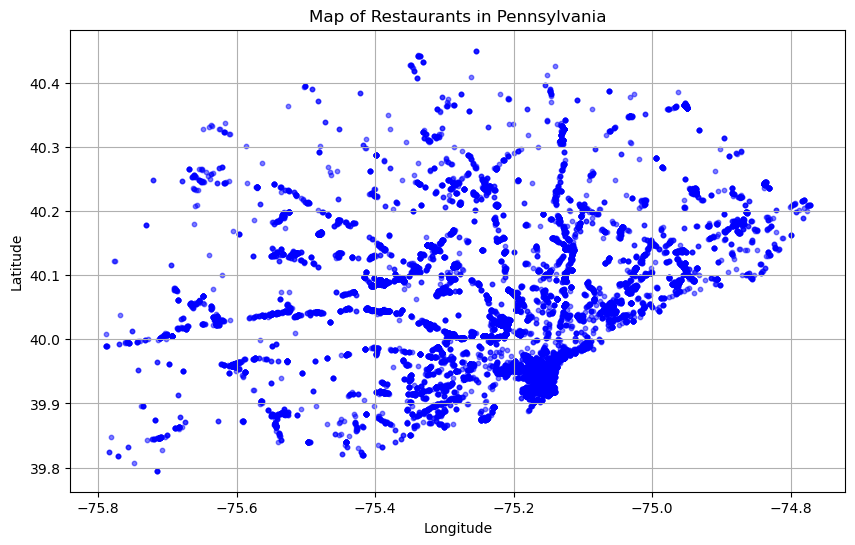

In [59]:
# plt of merged df on `longitude` and `latitude`

import matplotlib.pyplot as plt

# Visualize the restaurants on a map using their latitude and longitude
plt.figure(figsize=(10, 6))
plt.scatter(pa_restaurants_df['longitude'], pa_restaurants_df['latitude'], alpha=0.5, s=10, c='blue')
plt.title('Map of Restaurants in Pennsylvania')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

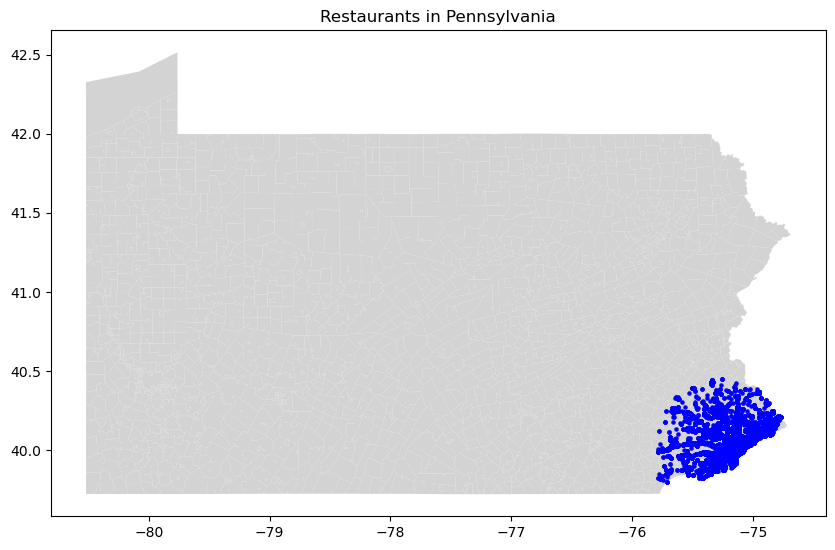

In [60]:
# plt of merged df on `longitude` and `latitude` with usage of geographic map using shapefile

import geopandas as gpd

# Full path to the CSV file
csv_file_path = r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\pa_restaurants.csv'

# Full path to the shapefile (assuming the file is in the same directory as the CSV)
shapefile_path = r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\tl_2019_42_cousub.zip'

# Load the restaurant data
restaurants_df = pd.read_csv(csv_file_path)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    restaurants_df, 
    geometry=gpd.points_from_xy(restaurants_df.longitude, restaurants_df.latitude)
)

# Set the initial CRS for the restaurant locations if it's not set
# CRS for WGS84 is EPSG:4326
if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)

# Load the shapefile for Pennsylvania
pa_shape = gpd.read_file(shapefile_path)

# Ensure the CRS matches for both GeoDataFrames, re-project if necessary
if gdf.crs != pa_shape.crs:
    gdf = gdf.to_crs(pa_shape.crs)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
pa_shape.plot(ax=ax, color='lightgray')  # Plot PA shape
gdf.plot(ax=ax, color='blue', markersize=5)  # Plot restaurant locations
ax.set_title('Restaurants in Pennsylvania')

# Show the plot
plt.show()

This map illustrates the geographic distribution of restaurants in Pennsylvania. Each blue point represents a restaurant location. Each blue point represents a restaurant location. Based on the clustering of points, it is likely that most restaurants within this dataset are located in Philadelphia.

## 5. Categorical to Numerical

Below is a markdown summary of the categorical features from your dataset that could be converted to a numerical format for the MLP model:

**business_id:**
- Unique identifier for each business.
- Typically not used as a feature in predictive models due to lack of predictive information.
- Could be considered for grouping if specific businesses are believed to impact the target variable significantly.

**name:**
- Generally not used as a feature unless the name contains relevant information (e.g., well-known brand names).
- Requires careful text processing if used.

**user_id:**
- Unique identifier for the user who wrote the review.
- Not directly used as a feature due to uniqueness.
- Could aggregate data at the user level (e.g., average rating given by the user) if user-specific effects are relevant.

**text:**
- Contains the content of the review
- Rich source of information, processable using various NLP techniques
- Sentiment Analysis: To gauge the overall sentiment, potentially correlating with star ratings
- TF-IDF/Count Vectorization: Converts text into a numerical vector based on word importance/frequency
- Word Embeddings: Utilizes pretrained vectors that capture semantic meanings of words

**city:**
- The city where the business is located.
- Convert to numerical format using one-hot encoding, creating a new binary column for each city.

**state:**
- The state in which the business is located.
- Can also be one-hot encoded to represent each state as a separate binary feature.

**categories:**
- Contains multiple categories separated by commas for each business, indicating the types of services or products offered.
- Complex due to its multi-label nature; options include one-hot encoding each unique category or using dimensionality reduction techniques on the resulting matrix.

**attributes:**
- JSON-like structures representing various business attributes, such as delivery options, outdoor seating availability, etc.
- Parse these structures and convert each attribute into a separate feature, possibly using binary encoding to indicate the presence or absence of each attribute.

**hours:** 
- Information about business hours in a JSON-like format.
- Potential features include total hours open per week, opening and closing times, or binary features indicating whether the business is open on specific days or weekends.
- When converting these categorical features into a numerical format, the goal is to make the data understandable for the MLP model while retaining as much of the original information as possible. Each feature's conversion approach should be chosen based on its relevance to the prediction task and the potential complexity it adds to the model.

5.1 Feature `text` TF-IDF

In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Initialize the TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=28098)

# Fit and transform the 'text' column
text_tfidf = tfidf_vectorizer.fit_transform(pa_restaurants_df['text'])

# Convert the TF-IDF result to a DataFrame
text_tfidf_df = pd.DataFrame(text_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Display the first few rows of the DataFrame with TF-IDF features
text_tfidf_df.head()

,00,000,00am,00dollar,00pm,00s,01,02,03,0371,04,05,06,07,08,09,0930,09pm,10,100,1000,100th,101,1016,1020,1030,104,104372950,106,107161934,10a,10am,10lbs,10min,10p,10pm,10th,11,110,1111,11150502,1116,113,1130,11470776,1150,11899935,11956268,11am,11ish,11pm,11th,12,120,1200,12107712,1212,12189146,123,1230,12377204,12406362,12422800,1245,125,128,12am,12hr,12noon,12oz,12p,12pm,12th,12yrs,13,130,135,136,13th,14,14th,15,150,1521,15min,15mins,15pm,15th,16,1688,16oz,16th,17,1711,172,1735,1751,1774,1790,17th,18,180,1800,1830s,1835,185,18902,18914,18th,19,190,1900,19001,19103,192,1921,1925,1930,1940s,1949,1950,1957,1958,1964,1980,1983,1984,1986,1988,1996,19th,1am,1fdc30f1,1irooy,1p,1pm,1skewers,1st,1starter,1x,20,200,2000,2003,2006,2007,2008,2009,200a,2011,2012,2013,2014,2015,20151028_firefighter_among_2_hurt_in_south_philly_fire,2016,20160517_phila__eateries_closed_for_health_violations,20161202_d_angelo_s_meats_is_said_to_be_closing_after_116_years_in_the_italian_market,20161210,2017,20170518,2018,20180131,20180302,20180322,2019,202,2023,2030,2069952,20am,20min,20mins,20minute,20oz,20pm,20th,20yrs,21,2100,2108,211,2147562221,215,21at,21st,22,222,224,225pm,22nd,22oz,23,230,230pm,23oz,23rd,24,2401,24h,24th,25,250,25pm,25th,26,267,26th,27,279,27f8034b,27th,28,281d,2841,28587153,288,28th,29,290,29th,2a,2am,2dhan7,2die4,2dozen,2lbs,2lionshead,2lit,2mi,2nd,2pcs,2pm,2sp,2st,2x,2xs,2yo,30,300,300s,301,309,30a,30am,30min,30p,30pm,30th,31,31st,32,321686011,322,32oz,33,33606259226,33rd,34th,35,36,365,375ml,37th,38th,39,3am,3c69d4ce,3d,3ea,3h,3lbs,3oz,3p,3pm,3rd,3x,40,400,4006,401,406,40lb,40min,40s,40th,41,42,4200,42nd,43,430,430p,430pm,43rd,44,440,45,450,454,45am,45min,45mins,45pm,48,49,491,49cents,49th,4am,4ever,4p,4pm,4ppl,4th,50,500,501,5056,50am,50cent,50cents,50s,50th,519,52nd,53,530,530p,54,545,546,55,550,551,554,56,560,5600,5646,57,575932,59,5900,5am,5k,5miles,5p,5pm,5stars,5th,5to7,5yrs,60,602988,60m,60s,61,610,611,614,618,62,625,63,630,639,64,64oz,64th,65,650,6529,66,6699,68,69,69th,6abc,6am,6b,6oz,6p,6pack,6pm,6th,6yrs,70,700,700cal,71,713,718,725,73,730,730pm,7326,74,7427,745,75,750ml,755,75c,76,76ers,77,7700,7702,77d893d9,78,790,7971,79th,7a,7am,7oz,7p,7pm,7th,7x,80,800,805,8096,820,824,830,8443,85,8522,86,863,87,878,879056,88,8a448618,8am,8oz,8p,8pm,8th,90,9000,9025,908,90s,90th,90º,91944,920,93,930am,94,945,948,95,9536,95n,98,99,99lb,9am,9ec13dd5f102a7af,9ecdacde01a8fc40,9mos,9oz,9p,9pc,9pm,9th,_report_full,_templates,_x,a1,a100,a20b,a20f,a9,aaa,aaaamazing,aadvantange,aah,aand,aaron,ab,abalone,abandoned,abba,abbey,abbreviated,abc,abcnews,abe,abilities,ability,abin,abington,abita,able,abm,abner,abners,aboard,abound,abounds,about,abouy,above,abraham,abrasive,abroad,abrupt,abruzzi,absolute,absolutely,absorb,absurd,absurdly,absynth,abt,abuelita,abundant,abused,abv,aby,abysmal,ac,ac9f,academy,acai,acc,accent,accept,acceptable,accepted,accepting,accepts,access,accessible,accessories,accidental,accidentally,accidently,accommodate,accommodated,accommodates,accommodating,accommodations,accomodating,accompanied,accompaniments,accompany,accompanying,accomplish,accomplished,according,accordingly,account,accountants,accurate,ace,ache,achieved,acid,acidic,acitvism,ack,acknowledge,acknowledged,acme,acoustic,acoustics,acquired,acrid,across,act,acted,acting,action,activate,activated,active,actively,activities,activity,acts,actual,actually,ad,adams,add,addams,added,adder,addict,addicted,addicting,addiction,addictive,addictively,addicts,adding,addition,additional,additions,additudes,address,addressed,addresses,adds,addtl,adecco,adedashi,adequate,adequately,adjacent,adjust,adjustment,administrative,admission,admit,admits,admitted,adnams,adobe,adobo,adonis,adorable,adorably,adore,adoring,adorned,adrian,adrienne,ads,adult,adults,adultshakes,advance,advanced,advantage,adventure,adventured,adventures,adventurous,advertise,advertised,advertises,advertising,adverts,advice,advise,adzuki,aerial,aervice,aesthetic,af,affair,affiliated,affirmation,affogato,affo

In [62]:
# Sum up the TF-IDF values for each document to create a single numeric feature
text_numeric = text_tfidf_df.sum(axis=1)

# Add this new feature to your original DataFrame
pa_restaurants_df['text_numeric_tfidf'] = text_numeric

# Display the first few rows of the updated DataFrame to confirm the new feature has been added
pa_restaurants_df.head()

C:\Users\yunus\AppData\Local\Temp\ipykernel_8792\3785281771.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pa_restaurants_df['text_numeric_tfidf'] = text_numeric


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count,restaurant_category,text_numeric_tfidf
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0,True,2.328180
5,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",dQDt0l5e9sre54eG7plUdA,Really good egg tart and bubble tea. Best we ...,2013-06-17 17:28:26,0,True,1.872346
6,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",jmCga_DqsGhzSz0KnWSelQ,Was told they stopped making almond tarts... U...,2015-04-25 12:54:25,0,True,2.575591
7,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",lpnI226_ekGGvkx2Kd-biQ,After 6 pm the bread is on sale!,2016-05-11 20:09:04,0,True,1.893392
8,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",GfOYE8ChRLVT9izL6UXMNA,Best steamed pork bun in chinatown!,2017-12-13 17:48:19,0,True,6.153136


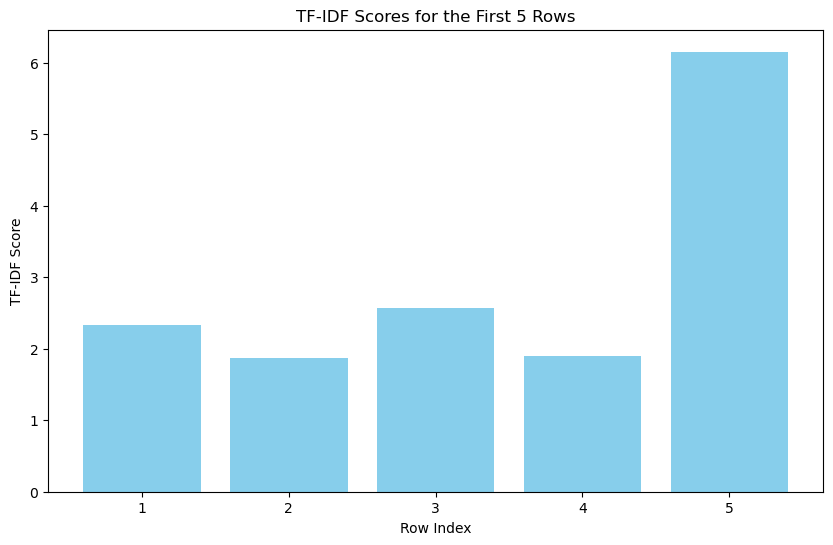

In [63]:
import matplotlib.pyplot as plt

# Extract TF-IDF scores for the first 5 rows
tfidf_scores = pa_restaurants_df['text_numeric_tfidf'].head()

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(range(len(tfidf_scores)), tfidf_scores, color='skyblue')
plt.xlabel('Row Index')
plt.ylabel('TF-IDF Score')
plt.title('TF-IDF Scores for the First 5 Rows')
plt.xticks(range(len(tfidf_scores)), range(1, len(tfidf_scores) + 1))  # Set x-axis ticks to row indices
plt.show()

In [64]:
# Assuming your original DataFrame is df_new (based on the dataset you've loaded here)
# and text_tfidf_df is the DataFrame with the TF-IDF features

# First, reset the index of both DataFrames to ensure alignment
df_new_reset = pa_restaurants_df.reset_index(drop=True)
text_tfidf_df_reset = text_tfidf_df.reset_index(drop=True)

# Concatenate the original DataFrame with the TF-IDF DataFrame along the column axis (axis=1)
combined_df = pd.concat([df_new_reset, text_tfidf_df_reset], axis=1)

5.2 Feature `text` with Count Vectorization

In [68]:
from sklearn.feature_extraction.text import CountVectorizer # Scikit-learn library convert textual data into numerical format

# Instantiate the CountVectorizer
vectorizer = CountVectorizer()

# Fit the vectorizer on the 'text' column to convert the textual data into a numerical format
X = vectorizer.fit_transform(pa_restaurants_df['text'])

# The result is a sparse matrix where each row corresponds to a review and each column to a word in the vocabulary.
# The values are the word counts in each review.
X.shape, X.nnz

((28098, 15917), 279482)

In [69]:
# import numpy as np

# Sum the counts of all words in each document to create a single numeric feature
text_numeric_vectorization = np.sum(X, axis=1)

# The result is a matrix. We need to flatten it to convert it to a 1D array suitable for adding as a new column
text_numeric_vectorization = np.asarray(text_numeric_vectorization).flatten()

# Add this new feature to your original DataFrame
pa_restaurants_df.loc[:, 'text_numeric_vectorization'] = text_numeric_vectorization

# Display the first few rows of the updated DataFrame to confirm the new feature has been added
pa_restaurants_df.head()

C:\Users\yunus\AppData\Local\Temp\ipykernel_8792\876642596.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pa_restaurants_df.loc[:, 'text_numeric_vectorization'] = text_numeric_vectorization


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,user_id,text,date,compliment_count,restaurant_category,text_numeric_tfidf,text_numeric_vectorization
4,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",WqeE5e5ROfaVEgkb9dAkiQ,Love their pastries and drinks!,2017-09-20 17:00:27,0,True,2.328180,5
5,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",dQDt0l5e9sre54eG7plUdA,Really good egg tart and bubble tea. Best we ...,2013-06-17 17:28:26,0,True,1.872346,15
6,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",jmCga_DqsGhzSz0KnWSelQ,Was told they stopped making almond tarts... U...,2015-04-25 12:54:25,0,True,2.575591,21
7,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",lpnI226_ekGGvkx2Kd-biQ,After 6 pm the bread is on sale!,2016-05-11 20:09:04,0,True,1.893392,7
8,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",GfOYE8ChRLVT9izL6UXMNA,Best steamed pork bun in chinatown!,2017-12-13 17:48:19,0,True,6.153136,6


## 6. Multi-Layer Perceptron (MLP)

**6.1 Multilayer Perceptron without Hyperparameter tuning**

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Load the data
df = pd.read_csv(r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\pa_restaurants.csv')

# Basic preprocessing
# Selecting relevant features for simplicity
features = ['latitude', 'longitude', 'review_count', 'is_open']
target = 'stars'

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Assuming your DataFrame 'df' has a column 'name' that contains the restaurant names
restaurant_names = df['name'].values  # Extracting names before splitting

# Splitting the data into training and testing sets (make sure you use the same random_state)
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Extracting test set names using the indices from X_test
test_names = restaurant_names[X_test.index]

# Preprocessing pipeline
numeric_features = ['latitude', 'longitude', 'review_count']
numeric_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
    ])

# Build the MLP model
def build_model(input_shape):
    model = Sequential([
        Dense(64, activation='relu', input_shape=input_shape),
        Dense(64, activation='relu'),
        Dense(1)  # Output layer
    ])
    
    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    return model

# Preprocess the data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Initialize the model
model = build_model((X_train_preprocessed.shape[1],))

# Train the model
model.fit(X_train_preprocessed, y_train, epochs=20, batch_size=16, validation_split=0.2)

# Evaluate the model
model.evaluate(X_test_preprocessed, y_test)

C:\Users\yunus\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 2.1415 - mean_absolute_error: 1.0371 - val_loss: 0.3653 - val_mean_absolute_error: 0.4735
Epoch 2/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.3613 - mean_absolute_error: 0.4665 - val_loss: 0.3623 - val_mean_absolute_error: 0.4717
Epoch 3/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.3624 - mean_absolute_error: 0.4685 - val_loss: 0.3680 - val_mean_absolute_error: 0.4757
Epoch 4/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.3598 - mean_absolute_error: 0.4643 - val_loss: 0.3567 - val_mean_absolute_error: 0.4661
Epoch 5/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.3572 - mean_absolute_error: 0.4625 - val_loss: 0.3894 - val_mean_absolute_error: 0.4964
Epoch 6/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3604 - mean_absolute_error: 0.4668 - val_loss: 0.3518 - val_mean_absolute_error: 0.4657
Epoch 7/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3539 - mean_absolute_er

[0.3496420979499817, 0.4701695442199707]

6.1.1 Results

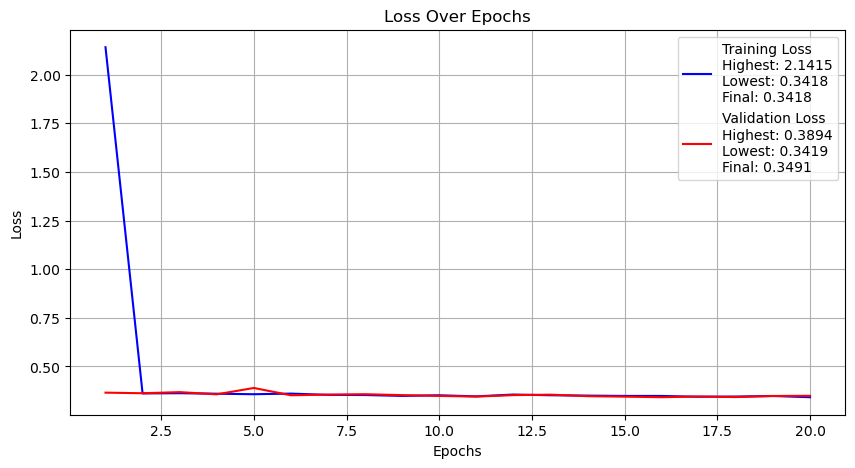

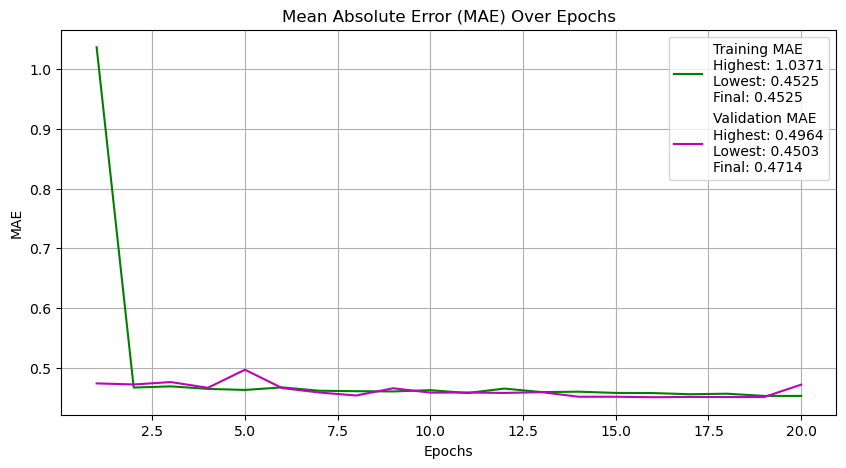

In [71]:
import matplotlib.pyplot as plt

# Provided epoch-wise loss and MAE values
epochs = range(1, 21)
training_loss = [
    2.1415, 0.3613, 0.3624, 0.3598, 0.3572, 0.3604, 0.3539, 0.3530, 
    0.3486, 0.3518, 0.3462, 0.3556, 0.3519, 0.3501, 0.3485, 0.3483, 
    0.3443, 0.3453, 0.3481, 0.3418
]
validation_loss = [
    0.3653, 0.3623, 0.3680, 0.3567, 0.3894, 0.3518, 0.3552, 0.3573, 
    0.3526, 0.3485, 0.3452, 0.3525, 0.3550, 0.3472, 0.3447, 0.3419, 
    0.3454, 0.3426, 0.3481, 0.3491
]
training_mae = [
    1.0371, 0.4665, 0.4685, 0.4643, 0.4625, 0.4668, 0.4612, 0.4604, 
    0.4600, 0.4621, 0.4574, 0.4648, 0.4589, 0.4596, 0.4575, 0.4573, 
    0.4553, 0.4562, 0.4525, 0.4525
]
validation_mae = [
    0.4735, 0.4717, 0.4757, 0.4661, 0.4964, 0.4657, 0.4582, 0.4532, 
    0.4653, 0.4580, 0.4582, 0.4575, 0.4588, 0.4511, 0.4511, 0.4503, 
    0.4508, 0.4506, 0.4506, 0.4714
]

# Find highest, lowest, and final values for both loss and MAE
def get_highest_lowest_final(data):
    return max(data), min(data), data[-1]

highest_training_loss, lowest_training_loss, final_training_loss = get_highest_lowest_final(training_loss)
highest_validation_loss, lowest_validation_loss, final_validation_loss = get_highest_lowest_final(validation_loss)
highest_training_mae, lowest_training_mae, final_training_mae = get_highest_lowest_final(training_mae)
highest_validation_mae, lowest_validation_mae, final_validation_mae = get_highest_lowest_final(validation_mae)

# Loss Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_loss, 'b', label=f'Training Loss\nHighest: {highest_training_loss:.4f}\nLowest: {lowest_training_loss:.4f}\nFinal: {final_training_loss:.4f}')
plt.plot(epochs, validation_loss, 'r', label=f'Validation Loss\nHighest: {highest_validation_loss:.4f}\nLowest: {lowest_validation_loss:.4f}\nFinal: {final_validation_loss:.4f}')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.grid(True)
plt.show()

# MAE Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_mae, 'g', label=f'Training MAE\nHighest: {highest_training_mae:.4f}\nLowest: {lowest_training_mae:.4f}\nFinal: {final_training_mae:.4f}')
plt.plot(epochs, validation_mae, 'm', label=f'Validation MAE\nHighest: {highest_validation_mae:.4f}\nLowest: {lowest_validation_mae:.4f}\nFinal: {final_validation_mae:.4f}')
plt.title('Mean Absolute Error (MAE) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.grid(True)
plt.show()

In [72]:
# Predicting outcomes for the test data
y_pred = model.predict(X_test_preprocessed)

# Define a small function to correctly format the ordinal numbers
def ordinal(n):
    return "%d%s" % (n, "tsnrhtdd"[(n // 10 % 10 != 1) * (n % 10 < 4) * n % 10::4])

# Loop through all predictions and actual values, using the actual restaurant names and their numbers
for i in range(len(y_pred)):
    # Use the ordinal function to get the correct suffix for each number
    restaurant_number = ordinal(i + 1)  # i starts from 0, hence i + 1
    print(f"Restaurant {restaurant_number} - {test_names[i]}:")
    print(f"Actual Star Rating: {y_test.iloc[i]}")
    print(f"Predicted Star Rating: {y_pred[i][0]:.2f}")
    print("-" * 30)

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Restaurant 1st - Bar Ferdinand:
Actual Star Rating: 3.5
Predicted Star Rating: 3.77
------------------------------
Restaurant 2nd - Friendly's:
Actual Star Rating: 1.5
Predicted Star Rating: 3.35
------------------------------
Restaurant 3rd - Helium Comedy Club:
Actual Star Rating: 3.5
Predicted Star Rating: 3.72
------------------------------
Restaurant 4th - Victory Beer Hall:
Actual Star Rating: 3.0
Predicted Star Rating: 3.58
------------------------------
Restaurant 5th - J B Dawson's Restaurant & Bar:
Actual Star Rating: 4.0
Predicted Star Rating: 3.45
------------------------------
Restaurant 6th - Asuka:
Actual Star Rating: 4.5
Predicted Star Rating: 3.73
------------------------------
Restaurant 7th - The Gold Standard Cafe:
Actual Star Rating: 3.0
Predicted Star Rating: 3.75
------------------------------
Restaurant 8th - Jeans Cafe:
Actual Star Rating: 4.0
Predicted Star Rating: 3.70
------------------------------
Restaurant 9th - Tr

6.1.2 Visualization of star rating

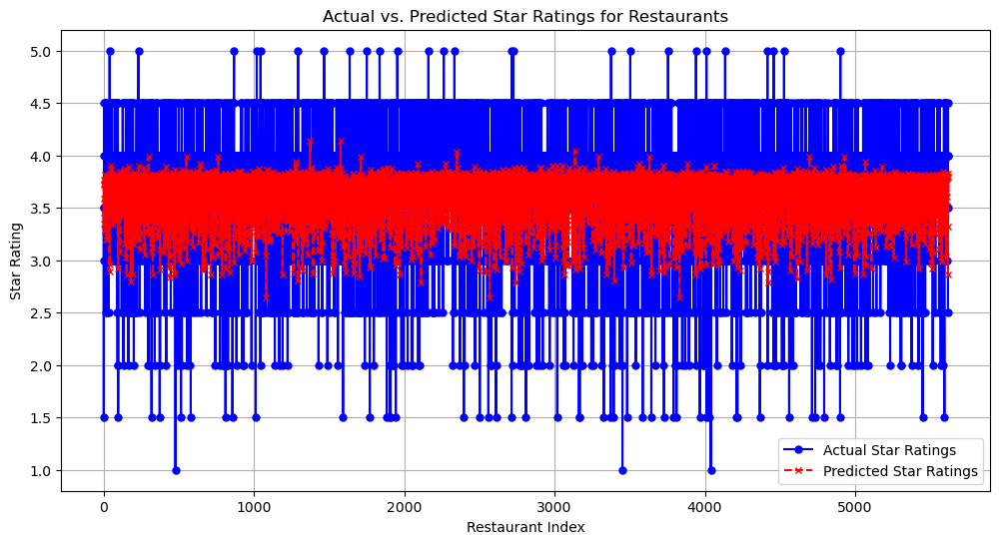

In [73]:
import matplotlib.pyplot as plt

# Ensure y_test is a numpy array for consistency
actual_stars = y_test.to_numpy()

# Flatten y_pred to ensure it has the same shape as actual_stars
predicted_stars = y_pred.flatten()

# Plotting
plt.figure(figsize=(12, 6))  # Set the figure size for clarity
plt.plot(actual_stars, label='Actual Star Ratings', color='blue', marker='o', linestyle='-', markersize=5)
plt.plot(predicted_stars, label='Predicted Star Ratings', color='red', marker='x', linestyle='--', markersize=5)
plt.title('Actual vs. Predicted Star Ratings for Restaurants')
plt.xlabel('Restaurant Index')
plt.ylabel('Star Rating')
plt.legend()
plt.grid(True)
plt.show()

Regarding to the model's performance, the final loss on the test set is approximately 0.339, and the mean absolute error (MAE) is around 0.452. The MAE value indicates that, on average, your model's predictions are about 0.452 stars away from the actual star ratings. Considering star ratings are typically on a scale of 1 to 5, this level of error might be acceptable depending on your application, but there's likely room for improvement.

**6.2 Multilayer Perceptron with Hyperparameter tuning**

MLP for Predicting Restaurant Ratings

This script showcases the development of a neural network model aimed at predicting restaurant ratings based on several key features. The steps taken include data preparation, model definition, hyperparameter tuning, and evaluation.

Data Preparation
- The dataset is loaded from `pa_restaurants.csv`, suggesting it contains information about various restaurants.
- The features selected for modeling include `latitude`, `longitude`, `review_count`, and the `is_open` status of the restaurants, which are numerical and directly related to the restaurant's operational and locational attributes.

Model Definition and Hyperparameter Tuning
- A `Sequential` model is constructed using TensorFlow, consisting of multiple dense layers. The model's flexibility is ensured by allowing for the tuning of the number of units in each layer and the choice of activation functions.
- Hyperparameter tuning is performed with `Keras Tuner` through a `RandomSearch` strategy, focusing on optimizing the validation mean absolute error. This process iteratively explores different model configurations to find the most effective setup.

Training and Model Evaluation
- The model undergoes training with a designated portion of the data, ensuring that the input features are standardized for optimal performance.
- After training, the model is evaluated against a test set to assess its accuracy in predicting restaurant ratings, with results quantified by loss and mean absolute error metrics.

The approach outlined in this script leverages a combination of locational and operational features of restaurants to predict their ratings, employing advanced neural network architectures and hyperparameter tuning for enhanced predictive performance.


In [75]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from keras_tuner import RandomSearch, HyperModel

# Load the data
df = pd.read_csv(r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\pa_restaurants.csv')

# Basic preprocessing
features = ['latitude', 'longitude', 'review_count', 'is_open']
target = 'stars'

# Splitting the data, ensuring 'name' is included for later reference
X = df[features].copy()
y = df[target]
X['name'] = df['name']  # Temporarily include 'name' for the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Save restaurant names from the test set, then remove 'name' from X_train and X_test
test_names = X_test['name'].values
X_train = X_train.drop(columns=['name'])
X_test = X_test.drop(columns=['name'])

# Preprocessing pipeline for numeric features
numeric_features = features  # 'name' has already been removed from X_train and X_test
numeric_transformer = StandardScaler()
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features)])

# Preprocess the data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Define the hypermodel
class MyHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(Input(shape=self.input_shape))  # Updated to use Input layer
        model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=512, step=32),
                        activation=hp.Choice('activation_1', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish'])))
        for i in range(hp.Int('num_layers', 1, 3)):
            model.add(Dense(units=hp.Int(f'units_{i+2}', min_value=32, max_value=512, step=32),
                            activation=hp.Choice(f'activation_{i+2}', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish', 'sigmoid'])))
        model.add(Dense(1))
        model.compile(optimizer=hp.Choice('optimizer', ['adam', 'sgd']),
                      loss='mean_squared_error',
                      metrics=['mean_absolute_error'])
        return model

# Initialize and run the hyperparameter tuner
hypermodel = MyHyperModel(input_shape=(X_train_preprocessed.shape[1],))

tuner = RandomSearch(
    hypermodel,
    objective='val_mean_absolute_error',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='hpt'
)

tuner.search(X_train_preprocessed, y_train, epochs=20, validation_split=0.2, batch_size=16)

# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Function to build model using best hyperparameters
def build_model_with_best_hps(best_hps):
    model = Sequential()
    model.add(Input(shape=(X_train_preprocessed.shape[1],)))  # Updated to use Input layer
    model.add(Dense(units=best_hps.get('units_1'),
                    activation=best_hps.get('activation_1')))
    for i in range(best_hps.get('num_layers')):
        model.add(Dense(units=best_hps.get(f'units_{i+2}'),
                        activation=best_hps.get(f'activation_{i+2}')))
    model.add(Dense(1))
    model.compile(optimizer=best_hps.get('optimizer'),
                  loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    return model

# Initialize and train the model with the best hyperparameters
model = build_model_with_best_hps(best_hps)
history = model.fit(X_train_preprocessed, y_train, epochs=20, batch_size=16, validation_split=0.2, verbose=2)

# Evaluate the model on the test dataset
test_loss, test_mae = model.evaluate(X_test_preprocessed, y_test)

# Print the test loss and mean absolute error
print(f"Test loss: {test_loss:.4f} - Test mean_absolute_error: {test_mae:.4f}")

Reloading Tuner from my_dir\hpt\tuner0.json
Epoch 1/20
1124/1124 - 9s - 8ms/step - loss: 0.4782 - mean_absolute_error: 0.5212 - val_loss: 0.3886 - val_mean_absolute_error: 0.4785
Epoch 2/20
1124/1124 - 7s - 6ms/step - loss: 0.3848 - mean_absolute_error: 0.4827 - val_loss: 0.3750 - val_mean_absolute_error: 0.4826
Epoch 3/20
1124/1124 - 6s - 6ms/step - loss: 0.3749 - mean_absolute_error: 0.4746 - val_loss: 0.3583 - val_mean_absolute_error: 0.4653
Epoch 4/20
1124/1124 - 8s - 7ms/step - loss: 0.3662 - mean_absolute_error: 0.4698 - val_loss: 0.3620 - val_mean_absolute_error: 0.4660
Epoch 5/20
1124/1124 - 6s - 5ms/step - loss: 0.3638 - mean_absolute_error: 0.4670 - val_loss: 0.3488 - val_mean_absolute_error: 0.4580
Epoch 6/20
1124/1124 - 4s - 4ms/step - loss: 0.3629 - mean_absolute_error: 0.4669 - val_loss: 0.3513 - val_mean_absolute_error: 0.4622
Epoch 7/20
1124/1124 - 5s - 5ms/step - loss: 0.3591 - mean_absolute_error: 0.4641 - val_loss: 0.3605 - val_mean_absolute_error: 0.4775
Epoch 8/20


6.2.1 Results

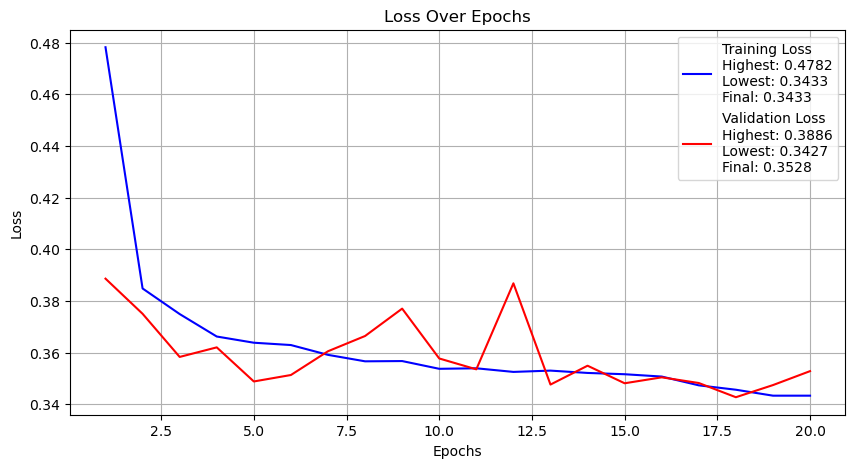

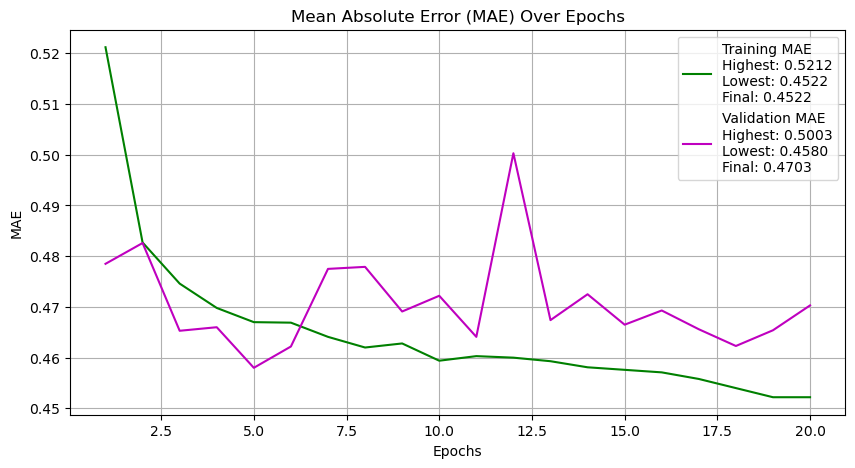

In [76]:
import matplotlib.pyplot as plt

# Provided epoch-wise loss and MAE values
epochs = range(1, 21)
training_loss = [
    0.4782, 0.3848, 0.3749, 0.3662, 0.3638, 0.3629, 0.3591, 0.3566, 
    0.3567, 0.3537, 0.3539, 0.3525, 0.3530, 0.3521, 0.3516, 0.3507, 
    0.3473, 0.3456, 0.3433, 0.3433
]
validation_loss = [
    0.3886, 0.3750, 0.3583, 0.3620, 0.3488, 0.3513, 0.3605, 0.3664, 
    0.3770, 0.3577, 0.3535, 0.3868, 0.3476, 0.3549, 0.3481, 0.3504, 
    0.3482, 0.3427, 0.3474, 0.3528
]
training_mae = [
    0.5212, 0.4827, 0.4746, 0.4698, 0.4670, 0.4669, 0.4641, 0.4620, 
    0.4628, 0.4594, 0.4603, 0.4600, 0.4593, 0.4581, 0.4576, 0.4571, 
    0.4558, 0.4540, 0.4522, 0.4522
]
validation_mae = [
    0.4785, 0.4826, 0.4653, 0.4660, 0.4580, 0.4622, 0.4775, 0.4779, 
    0.4691, 0.4722, 0.4641, 0.5003, 0.4674, 0.4725, 0.4665, 0.4693, 
    0.4656, 0.4623, 0.4654, 0.4703
]

# Find highest, lowest, and final values for both loss and MAE
def get_highest_lowest_final(data):
    return max(data), min(data), data[-1]

highest_training_loss, lowest_training_loss, final_training_loss = get_highest_lowest_final(training_loss)
highest_validation_loss, lowest_validation_loss, final_validation_loss = get_highest_lowest_final(validation_loss)
highest_training_mae, lowest_training_mae, final_training_mae = get_highest_lowest_final(training_mae)
highest_validation_mae, lowest_validation_mae, final_validation_mae = get_highest_lowest_final(validation_mae)

# Loss Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_loss, 'b', label=f'Training Loss\nHighest: {highest_training_loss:.4f}\nLowest: {lowest_training_loss:.4f}\nFinal: {final_training_loss:.4f}')
plt.plot(epochs, validation_loss, 'r', label=f'Validation Loss\nHighest: {highest_validation_loss:.4f}\nLowest: {lowest_validation_loss:.4f}\nFinal: {final_validation_loss:.4f}')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.grid(True)
plt.show()

# MAE Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_mae, 'g', label=f'Training MAE\nHighest: {highest_training_mae:.4f}\nLowest: {lowest_training_mae:.4f}\nFinal: {final_training_mae:.4f}')
plt.plot(epochs, validation_mae, 'm', label=f'Validation MAE\nHighest: {highest_validation_mae:.4f}\nLowest: {lowest_validation_mae:.4f}\nFinal: {final_validation_mae:.4f}')
plt.title('Mean Absolute Error (MAE) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.grid(True)
plt.show()

In [77]:
# Retrieve all trials from the tuner
all_trials = tuner.oracle.trials.values()

# Sort trials by their IDs numerically and then print the details
sorted_trials = sorted(all_trials, key=lambda trial: trial.trial_id)

for trial in sorted_trials:
    print(f"Trial {trial.trial_id}:")
    print(f"    Hyperparameters: {trial.hyperparameters.values}")
    print(f"    Score: {trial.score}")
    print(f"    Status: {trial.status}")
    print()

Trial 00:
    Hyperparameters: {'units_1': 288, 'activation_1': 'leaky_relu', 'num_layers': 2, 'units_2': 160, 'activation_2': 'relu', 'optimizer': 'sgd', 'units_3': 32, 'activation_3': 'relu'}
    Score: 0.4535645842552185
    Status: COMPLETED

Trial 01:
    Hyperparameters: {'units_1': 256, 'activation_1': 'swish', 'num_layers': 2, 'units_2': 512, 'activation_2': 'elu', 'optimizer': 'sgd', 'units_3': 384, 'activation_3': 'elu'}
    Score: 0.46125516295433044
    Status: COMPLETED

Trial 02:
    Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}
    Score: 0.449196457862854
    Status: COMPLETED

Trial 03:
    Hyperparameters: {'units_1': 64, 'activation_1': 'relu', 'num_layers': 3, 'units_2': 320, 'activation_2': 'tanh', 'optimizer': 'sgd', 'units_3': 288, 'activation_3': 'leaky_relu', 'units_4': 32, 'activation_4': 'relu'}
    Score: 0.4532665014266968


In [78]:
# Initialize variables to track the best trial
best_trial_id = None
lowest_mae = float('inf')  # Set it to "infinity" to ensure any real score is lower

# Iterate over the trials to find the one with the lowest MAE
for trial_id, trial in tuner.oracle.trials.items():
    # Check if the current trial has a lower score than what we've seen so far
    if trial.score is not None and trial.score < lowest_mae:
        best_trial_id = trial_id
        lowest_mae = trial.score

# Print details of the best trial
print(f"Best Trial ID: {best_trial_id}")
print(f"Lowest MAE: {lowest_mae}")
print(f"Hyperparameters: {tuner.oracle.trials[best_trial_id].hyperparameters.values}")

Best Trial ID: 02
Lowest MAE: 0.449196457862854
Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}


1) Best Trial ID: Each trial is assigned a unique identifier. "02" here signifies the specific trial that had the best performance according to the set objective, which in this case is minimizing the mean absolute error (MAE).
2) Lowest MAE: The mean absolute error achieved by the model in Trial ID 02 during validation. A lower MAE indicates that, on average, the model's predictions were closer to the actual values.
3) Hyperparameters: These are the specific settings used to configure the model for this trial:

- units_1: 128 — The first dense layer in the model has 128 neurons.
- activation_1: 'relu' — The activation function used by the neurons in the first dense layer is the Rectified Linear Unit (ReLU), which is a common choice for non-linear transformations in neural networks.
- num_layers: 2 — There are two additional hidden layers beyond the input layer. This does not include the output layer.
- units_2: 384 — The second dense layer has 384 neurons.
- activation_2: 'tanh' — The activation function for the second dense layer is the hyperbolic tangent (tanh), which outputs values between -1 and 1 and is also a popular activation function.
- optimizer: 'adam' — The optimizer used for training the model is Adam, an adaptive learning rate optimizer that is widely used for training deep neural networks.
- units_3: 192 — The third dense layer (second additional hidden layer) has 192 neurons.
- activation_3: 'leaky_relu' — The activation function for the third dense layer is Leaky ReLU, a variant of ReLU designed to fix the "dying ReLU" problem, allowing small gradients when the unit is not active.

In [79]:
# Predicting outcomes for the test data
y_pred = model.predict(X_test_preprocessed)

# Define a small function to correctly format the ordinal numbers
def ordinal(n):
    return "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

# Loop through all predictions and actual values, using the actual restaurant names and their numbers
for i in range(len(y_pred)):
    # Use the ordinal function to get the correct suffix for each number
    restaurant_number = ordinal(i + 1)  # i starts from 0, hence i + 1
    print(f"Restaurant {restaurant_number} - {test_names[i]}:")
    print(f"Actual Star Rating: {y_test.iloc[i]}")
    print(f"Predicted Star Rating: {y_pred[i][0]:.2f}")
    print("-" * 30)

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Restaurant 1st - Bar Ferdinand:
Actual Star Rating: 3.5
Predicted Star Rating: 3.58
------------------------------
Restaurant 2nd - Friendly's:
Actual Star Rating: 1.5
Predicted Star Rating: 3.29
------------------------------
Restaurant 3rd - Helium Comedy Club:
Actual Star Rating: 3.5
Predicted Star Rating: 3.78
------------------------------
Restaurant 4th - Victory Beer Hall:
Actual Star Rating: 3.0
Predicted Star Rating: 3.45
------------------------------
Restaurant 5th - J B Dawson's Restaurant & Bar:
Actual Star Rating: 4.0
Predicted Star Rating: 3.49
------------------------------
Restaurant 6th - Asuka:
Actual Star Rating: 4.5
Predicted Star Rating: 3.83
------------------------------
Restaurant 7th - The Gold Standard Cafe:
Actual Star Rating: 3.0
Predicted Star Rating: 3.77
------------------------------
Restaurant 8th - Jeans Cafe:
Actual Star Rating: 4.0
Predicted Star Rating: 3.78
------------------------------
Restaurant 9th - Tr

6.2.2 Visualization

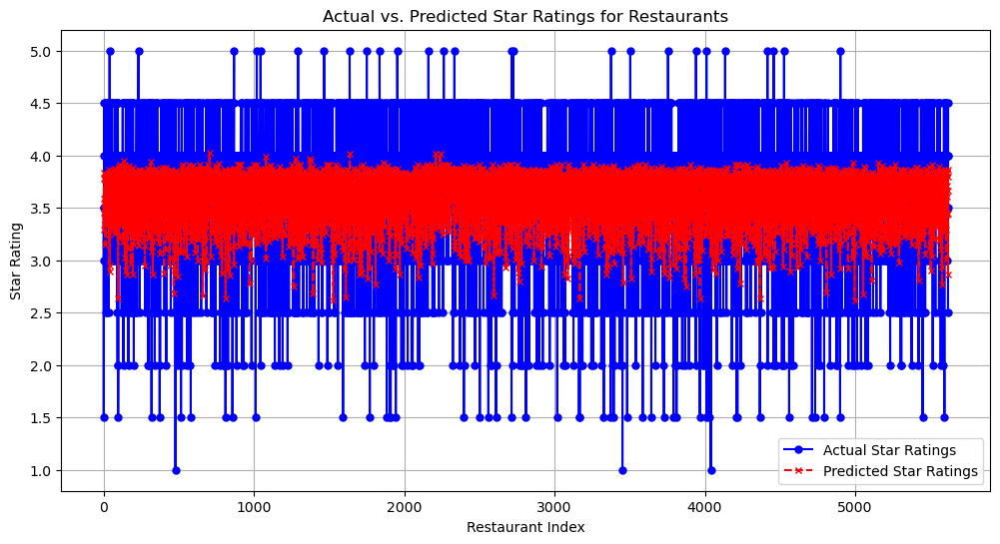

In [80]:
import matplotlib.pyplot as plt

# Ensure y_test is a numpy array for consistency
actual_stars = y_test.to_numpy()

# Flatten y_pred to ensure it has the same shape as actual_stars
predicted_stars = y_pred.flatten()

# Plotting
plt.figure(figsize=(12, 6))  # Set the figure size for clarity
plt.plot(actual_stars, label='Actual Star Ratings', color='blue', marker='o', linestyle='-', markersize=5)
plt.plot(predicted_stars, label='Predicted Star Ratings', color='red', marker='x', linestyle='--', markersize=5)
plt.title('Actual vs. Predicted Star Ratings for Restaurants')
plt.xlabel('Restaurant Index')
plt.ylabel('Star Rating')
plt.legend()
plt.grid(True)
plt.show()

In [81]:
pa_restaurants_df.to_csv('pa_restaurants.csv', index=True)

**6.3 Multilayer Perceptron with Hyperparameter tuning and with integrating TF-IDF**

In [88]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from keras_tuner import RandomSearch, HyperModel

# Load the data
df = pd.read_csv(r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\pa_restaurants2.csv')

# Basic preprocessing
features = ['text_numeric_tfidf', 'latitude', 'longitude', 'review_count', 'is_open']
target = 'stars'

# Splitting the data, ensuring 'name' is included for later reference
X = df[features].copy()
y = df[target]
X['name'] = df['name']  # Temporarily include 'name' for the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Save restaurant names from the test set, then remove 'name' from X_train and X_test
test_names = X_test['name'].values
X_train = X_train.drop(columns=['name'])
X_test = X_test.drop(columns=['name'])

# Preprocessing pipeline for numeric features
numeric_features = features  # 'name' has already been removed from X_train and X_test
numeric_transformer = StandardScaler()
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features)])

# Preprocess the data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Define the hypermodel
class MyHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(Input(shape=self.input_shape))  # Updated to use Input layer
        model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=512, step=32),
                        activation=hp.Choice('activation_1', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish'])))
        for i in range(hp.Int('num_layers', 1, 3)):
            model.add(Dense(units=hp.Int(f'units_{i+2}', min_value=32, max_value=512, step=32),
                            activation=hp.Choice(f'activation_{i+2}', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish', 'sigmoid'])))
        model.add(Dense(1))
        model.compile(optimizer=hp.Choice('optimizer', ['adam', 'sgd']),
                      loss='mean_squared_error',
                      metrics=['mean_absolute_error'])
        return model

# Initialize and run the hyperparameter tuner
hypermodel = MyHyperModel(input_shape=(X_train_preprocessed.shape[1],))

tuner = RandomSearch(
    hypermodel,
    objective='val_mean_absolute_error',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='hpt'
)

tuner.search(X_train_preprocessed, y_train, epochs=20, validation_split=0.2, batch_size=16)

# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Function to build model using best hyperparameters
def build_model_with_best_hps(best_hps):
    model = Sequential()
    model.add(Input(shape=(X_train_preprocessed.shape[1],)))  # Updated to use Input layer
    model.add(Dense(units=best_hps.get('units_1'),
                    activation=best_hps.get('activation_1')))
    for i in range(best_hps.get('num_layers')):
        model.add(Dense(units=best_hps.get(f'units_{i+2}'),
                        activation=best_hps.get(f'activation_{i+2}')))
    model.add(Dense(1))
    model.compile(optimizer=best_hps.get('optimizer'),
                  loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    return model

# Initialize and train the model with the best hyperparameters
model = build_model_with_best_hps(best_hps)
history = model.fit(X_train_preprocessed, y_train, epochs=20, batch_size=16, validation_split=0.2, verbose=1)

# Evaluate the model on the test dataset
test_loss, test_mae = model.evaluate(X_test_preprocessed, y_test)

# Print the test loss and mean absolute error
print(f"Test loss: {test_loss:.4f} - Test mean_absolute_error: {test_mae:.4f}")

Reloading Tuner from my_dir\hpt\tuner0.json
Epoch 1/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 1.3670 - mean_absolute_error: 0.7662 - val_loss: 0.4027 - val_mean_absolute_error: 0.5038
Epoch 2/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.4051 - mean_absolute_error: 0.4994 - val_loss: 0.4046 - val_mean_absolute_error: 0.5049
Epoch 3/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.4200 - mean_absolute_error: 0.5111 - val_loss: 0.4028 - val_mean_absolute_error: 0.5043
Epoch 4/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - loss: 0.4123 - mean_absolute_error: 0.5043 - val_loss: 0.4046 - val_mean_absolute_error: 0.5049
Epoch 5/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.4033 - mean_absolute_error: 0.4998 - val_loss: 0.4103 - val_mean_absolute_error: 0.5023
Epoch 6/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.4107 - mean_absolute_error: 0.5046 - val_loss: 0.4026 - val_mean_absolute_error: 0.5039
Epoch 7/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 9s

6.3.1 Results

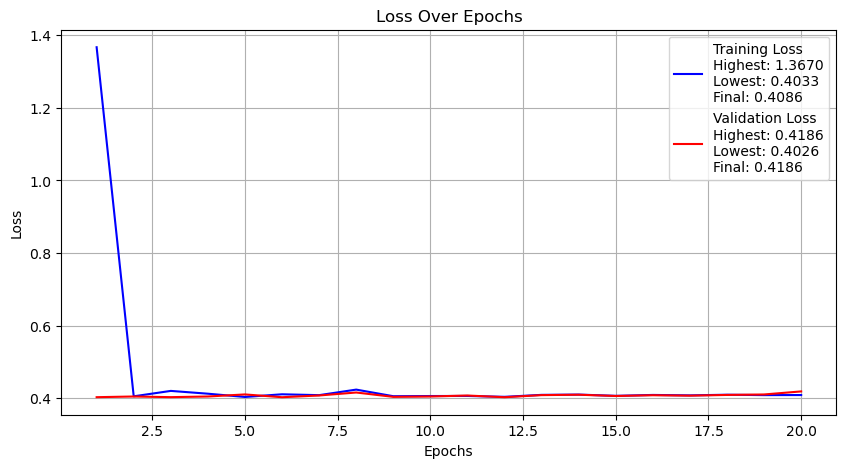

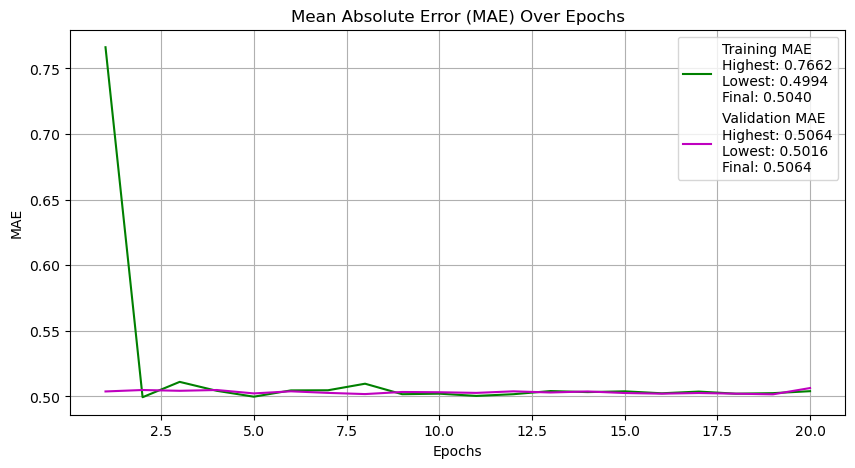

In [89]:
import matplotlib.pyplot as plt

# Provided epoch-wise loss and MAE values
epochs = range(1, 21)
training_loss = [
    1.3670, 0.4051, 0.4200, 0.4123, 0.4033, 0.4107, 0.4083, 0.4236, 
    0.4054, 0.4059, 0.4061, 0.4037, 0.4091, 0.4099, 0.4064, 0.4089, 
    0.4077, 0.4095, 0.4084, 0.4086
]
validation_loss = [
    0.4027, 0.4046, 0.4028, 0.4046, 0.4103, 0.4026, 0.4074, 0.4156, 
    0.4036, 0.4046, 0.4073, 0.4026, 0.4084, 0.4095, 0.4060, 0.4081, 
    0.4069, 0.4089, 0.4102, 0.4186
]
training_mae = [
    0.7662, 0.4994, 0.5111, 0.5043, 0.4998, 0.5046, 0.5047, 0.5097, 
    0.5017, 0.5021, 0.5004, 0.5017, 0.5041, 0.5033, 0.5039, 0.5024, 
    0.5037, 0.5021, 0.5025, 0.5040
]
validation_mae = [
    0.5038, 0.5049, 0.5043, 0.5049, 0.5023, 0.5039, 0.5027, 0.5018, 
    0.5034, 0.5032, 0.5027, 0.5039, 0.5030, 0.5038, 0.5026, 0.5021, 
    0.5026, 0.5021, 0.5016, 0.5064
]

# Find highest, lowest, and final values for both loss and MAE
def get_highest_lowest_final(data):
    return max(data), min(data), data[-1]

highest_training_loss, lowest_training_loss, final_training_loss = get_highest_lowest_final(training_loss)
highest_validation_loss, lowest_validation_loss, final_validation_loss = get_highest_lowest_final(validation_loss)
highest_training_mae, lowest_training_mae, final_training_mae = get_highest_lowest_final(training_mae)
highest_validation_mae, lowest_validation_mae, final_validation_mae = get_highest_lowest_final(validation_mae)

# Loss Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_loss, 'b', label=f'Training Loss\nHighest: {highest_training_loss:.4f}\nLowest: {lowest_training_loss:.4f}\nFinal: {final_training_loss:.4f}')
plt.plot(epochs, validation_loss, 'r', label=f'Validation Loss\nHighest: {highest_validation_loss:.4f}\nLowest: {lowest_validation_loss:.4f}\nFinal: {final_validation_loss:.4f}')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.grid(True)
plt.show()

# MAE Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_mae, 'g', label=f'Training MAE\nHighest: {highest_training_mae:.4f}\nLowest: {lowest_training_mae:.4f}\nFinal: {final_training_mae:.4f}')
plt.plot(epochs, validation_mae, 'm', label=f'Validation MAE\nHighest: {highest_validation_mae:.4f}\nLowest: {lowest_validation_mae:.4f}\nFinal: {final_validation_mae:.4f}')
plt.title('Mean Absolute Error (MAE) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.grid(True)
plt.show()

In [90]:
# Retrieve all trials from the tuner
all_trials = tuner.oracle.trials.values()

# Sort trials by their IDs numerically and then print the details
sorted_trials = sorted(all_trials, key=lambda trial: trial.trial_id)

for trial in sorted_trials:
    print(f"Trial {trial.trial_id}:")
    print(f"    Hyperparameters: {trial.hyperparameters.values}")
    print(f"    Score: {trial.score}")
    print(f"    Status: {trial.status}")
    print()

Trial 00:
    Hyperparameters: {'units_1': 288, 'activation_1': 'leaky_relu', 'num_layers': 2, 'units_2': 160, 'activation_2': 'relu', 'optimizer': 'sgd', 'units_3': 32, 'activation_3': 'relu'}
    Score: 0.4535645842552185
    Status: COMPLETED

Trial 01:
    Hyperparameters: {'units_1': 256, 'activation_1': 'swish', 'num_layers': 2, 'units_2': 512, 'activation_2': 'elu', 'optimizer': 'sgd', 'units_3': 384, 'activation_3': 'elu'}
    Score: 0.46125516295433044
    Status: COMPLETED

Trial 02:
    Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}
    Score: 0.449196457862854
    Status: COMPLETED

Trial 03:
    Hyperparameters: {'units_1': 64, 'activation_1': 'relu', 'num_layers': 3, 'units_2': 320, 'activation_2': 'tanh', 'optimizer': 'sgd', 'units_3': 288, 'activation_3': 'leaky_relu', 'units_4': 32, 'activation_4': 'relu'}
    Score: 0.4532665014266968


In [91]:
# Initialize variables to track the best trial
best_trial_id = None
lowest_mae = float('inf')  # Set it to "infinity" to ensure any real score is lower

# Iterate over the trials to find the one with the lowest MAE
for trial_id, trial in tuner.oracle.trials.items():
    # Check if the current trial has a lower score than what we've seen so far
    if trial.score is not None and trial.score < lowest_mae:
        best_trial_id = trial_id
        lowest_mae = trial.score

# Print details of the best trial
print(f"Best Trial ID: {best_trial_id}")
print(f"Lowest MAE: {lowest_mae}")
print(f"Hyperparameters: {tuner.oracle.trials[best_trial_id].hyperparameters.values}")

Best Trial ID: 02
Lowest MAE: 0.449196457862854
Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}


In [92]:
# Predicting outcomes for the test data
y_pred = model.predict(X_test_preprocessed)

# Define a small function to correctly format the ordinal numbers
def ordinal(n):
    return "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

# Loop through all predictions and actual values, using the actual restaurant names and their numbers
for i in range(len(y_pred)):
    # Use the ordinal function to get the correct suffix for each number
    restaurant_number = ordinal(i + 1)  # i starts from 0, hence i + 1
    print(f"Restaurant {restaurant_number} - {test_names[i]}:")
    print(f"Actual Star Rating: {y_test.iloc[i]}")
    print(f"Predicted Star Rating: {y_pred[i][0]:.2f}")
    print("-" * 30)

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Restaurant 1st - Bar Ferdinand:
Actual Star Rating: 3.5
Predicted Star Rating: 3.54
------------------------------
Restaurant 2nd - Friendly's:
Actual Star Rating: 1.5
Predicted Star Rating: 3.54
------------------------------
Restaurant 3rd - Helium Comedy Club:
Actual Star Rating: 3.5
Predicted Star Rating: 3.54
------------------------------
Restaurant 4th - Victory Beer Hall:
Actual Star Rating: 3.0
Predicted Star Rating: 3.54
------------------------------
Restaurant 5th - J B Dawson's Restaurant & Bar:
Actual Star Rating: 4.0
Predicted Star Rating: 3.54
------------------------------
Restaurant 6th - Asuka:
Actual Star Rating: 4.5
Predicted Star Rating: 3.54
------------------------------
Restaurant 7th - The Gold Standard Cafe:
Actual Star Rating: 3.0
Predicted Star Rating: 3.54
------------------------------
Restaurant 8th - Jeans Cafe:
Actual Star Rating: 4.0
Predicted Star Rating: 3.54
------------------------------
Restaurant 9th - Tr

6.3.2 Visualization

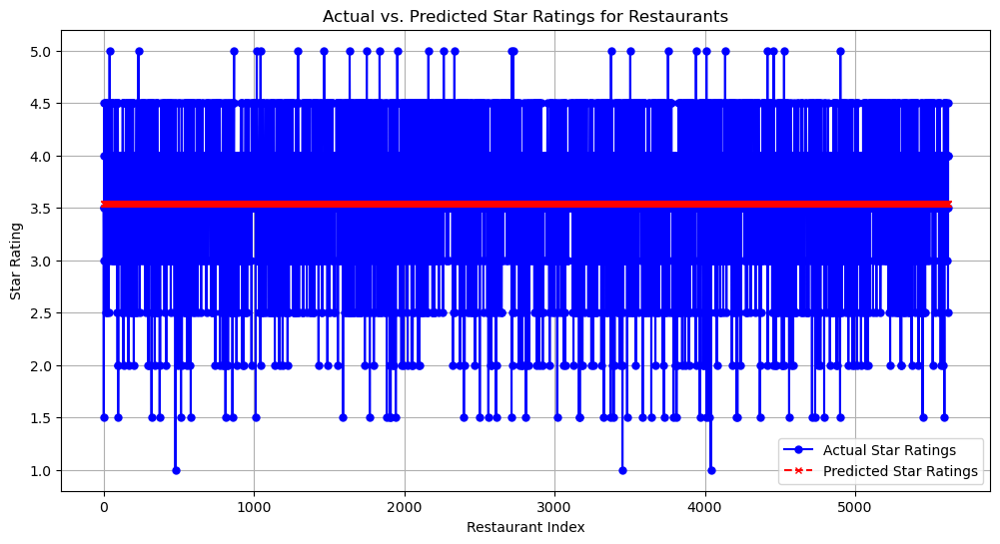

In [93]:
import matplotlib.pyplot as plt

# Ensure y_test is a numpy array for consistency
actual_stars = y_test.to_numpy()

# Flatten y_pred to ensure it has the same shape as actual_stars
predicted_stars = y_pred.flatten()

# Plotting
plt.figure(figsize=(12, 6))  # Set the figure size for clarity
plt.plot(actual_stars, label='Actual Star Ratings', color='blue', marker='o', linestyle='-', markersize=5)
plt.plot(predicted_stars, label='Predicted Star Ratings', color='red', marker='x', linestyle='--', markersize=5)
plt.title('Actual vs. Predicted Star Ratings for Restaurants')
plt.xlabel('Restaurant Index')
plt.ylabel('Star Rating')
plt.legend()
plt.grid(True)
plt.show()

**6.4 Multilayer Perceptron with Hyperparameter tuning and with integrating count vectorization**

MLP Model for Predicting Restaurant Ratings with one Text Features

This script demonstrates building and tuning a neural network model to predict restaurant ratings based on various features, including a text-derived numerical vectorization. The process involves several key steps:

Data Loading and Preprocessing
- Data is loaded from `pa_restaurants2.csv`, indicating an updated or different dataset.
- Features include geographic information (`latitude`, `longitude`), `review_count`, `is_open` status, and a `text_numeric_vectorization` feature, which suggests analysis of textual data.

Model Building and Hyperparameter Tuning
- A neural network model is defined with a flexible architecture allowing for hyperparameter tuning of layer sizes and activations.
- `Keras Tuner` is employed to optimize model parameters, seeking to minimize validation mean absolute error over a series of trials.

Training and Evaluation
- The model is trained on a standardized subset of the data, excluding the restaurant names for fairness in evaluation.
- Final evaluation on the test set provides a measure of the model's predictive performance, with results indicating the loss and mean absolute error.

This approach integrates both traditional numeric features and advanced text analysis, aiming to enhance the model's understanding and prediction of restaurant ratings.

In [82]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from keras_tuner import RandomSearch, HyperModel

# Load the data
df = pd.read_csv(r'C:\Users\yunus\Desktop\MSc\Digital Driven Business\Subjects\System Development for Marketing\RecSys\Yelp Dataset\System-Development-for-Marketing\pa_restaurants2.csv')

# Basic preprocessing
features = ['text_numeric_vectorization', 'latitude', 'longitude', 'review_count', 'is_open']
target = 'stars'

# Splitting the data, ensuring 'name' is included for later reference
X = df[features].copy()
y = df[target]
X['name'] = df['name']  # Temporarily include 'name' for the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Save restaurant names from the test set, then remove 'name' from X_train and X_test
test_names = X_test['name'].values
X_train = X_train.drop(columns=['name'])
X_test = X_test.drop(columns=['name'])

# Preprocessing pipeline for numeric features
numeric_features = features  # 'name' has already been removed from X_train and X_test
numeric_transformer = StandardScaler()
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features)])

# Preprocess the data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Define the hypermodel
class MyHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(Input(shape=self.input_shape))  # Updated to use Input layer
        model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=512, step=32),
                        activation=hp.Choice('activation_1', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish'])))
        for i in range(hp.Int('num_layers', 1, 3)):
            model.add(Dense(units=hp.Int(f'units_{i+2}', min_value=32, max_value=512, step=32),
                            activation=hp.Choice(f'activation_{i+2}', ['relu', 'tanh', 'leaky_relu', 'elu', 'swish', 'sigmoid'])))
        model.add(Dense(1))
        model.compile(optimizer=hp.Choice('optimizer', ['adam', 'sgd']),
                      loss='mean_squared_error',
                      metrics=['mean_absolute_error'])
        return model

# Initialize and run the hyperparameter tuner
hypermodel = MyHyperModel(input_shape=(X_train_preprocessed.shape[1],))

tuner = RandomSearch(
    hypermodel,
    objective='val_mean_absolute_error',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='hpt'
)

tuner.search(X_train_preprocessed, y_train, epochs=20, validation_split=0.2, batch_size=16)

# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Function to build model using best hyperparameters
def build_model_with_best_hps(best_hps):
    model = Sequential()
    model.add(Input(shape=(X_train_preprocessed.shape[1],)))  # Updated to use Input layer
    model.add(Dense(units=best_hps.get('units_1'),
                    activation=best_hps.get('activation_1')))
    for i in range(best_hps.get('num_layers')):
        model.add(Dense(units=best_hps.get(f'units_{i+2}'),
                        activation=best_hps.get(f'activation_{i+2}')))
    model.add(Dense(1))
    model.compile(optimizer=best_hps.get('optimizer'),
                  loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    return model

# Initialize and train the model with the best hyperparameters
model = build_model_with_best_hps(best_hps)
history = model.fit(X_train_preprocessed, y_train, epochs=20, batch_size=16, validation_split=0.2, verbose=1)

# Evaluate the model on the test dataset
test_loss, test_mae = model.evaluate(X_test_preprocessed, y_test)

# Print the test loss and mean absolute error
print(f"Test loss: {test_loss:.4f} - Test mean_absolute_error: {test_mae:.4f}")

Reloading Tuner from my_dir\hpt\tuner0.json
Epoch 1/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.8845 - mean_absolute_error: 0.6603 - val_loss: 0.3907 - val_mean_absolute_error: 0.4950
Epoch 2/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.3826 - mean_absolute_error: 0.4818 - val_loss: 0.4072 - val_mean_absolute_error: 0.5095
Epoch 3/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.3795 - mean_absolute_error: 0.4775 - val_loss: 0.3572 - val_mean_absolute_error: 0.4620
Epoch 4/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.3765 - mean_absolute_error: 0.4749 - val_loss: 0.3710 - val_mean_absolute_error: 0.4597
Epoch 5/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.3640 - mean_absolute_error: 0.4670 - val_loss: 0.3598 - val_mean_absolute_error: 0.4687
Epoch 6/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.3517 - mean_absolute_error: 0.4577 - val_loss: 0.3715 - val_mean_absolute_error: 0.4609
Epoch 7/20
1124/1124 ━━━━━━━━━━━━━━━━━━━━ 5s

6.4.1 Results

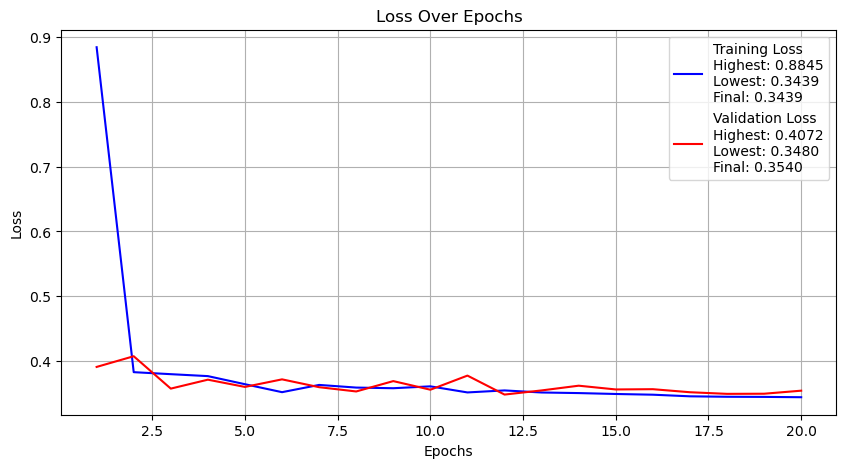

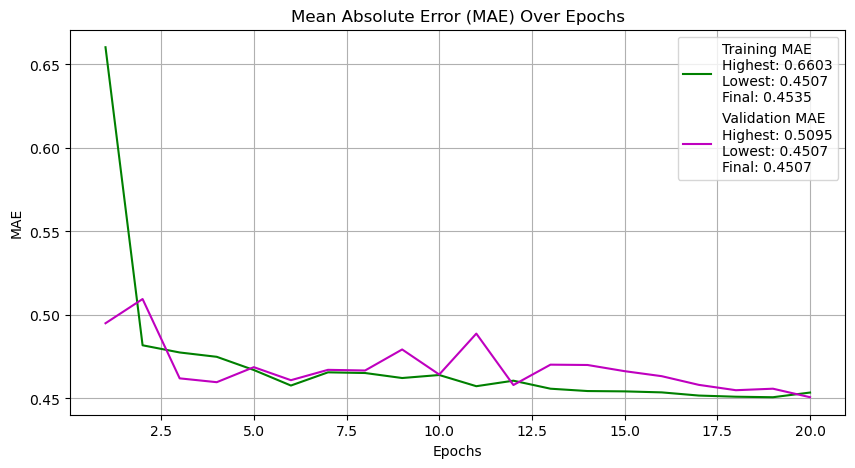

In [83]:
import matplotlib.pyplot as plt

# Provided epoch-wise loss and MAE values
epochs = range(1, 21)
training_loss = [
    0.8845, 0.3826, 0.3795, 0.3765, 0.3640, 0.3517, 0.3629, 0.3588, 
    0.3578, 0.3607, 0.3513, 0.3544, 0.3512, 0.3503, 0.3489, 0.3478, 
    0.3453, 0.3446, 0.3444, 0.3439
]
validation_loss = [
    0.3907, 0.4072, 0.3572, 0.3710, 0.3598, 0.3715, 0.3594, 0.3528, 
    0.3688, 0.3555, 0.3773, 0.3480, 0.3544, 0.3617, 0.3559, 0.3563, 
    0.3516, 0.3491, 0.3493, 0.3540
]
training_mae = [
    0.6603, 0.4818, 0.4775, 0.4749, 0.4670, 0.4577, 0.4656, 0.4652, 
    0.4622, 0.4640, 0.4573, 0.4606, 0.4558, 0.4544, 0.4542, 0.4536, 
    0.4517, 0.4510, 0.4507, 0.4535
]
validation_mae = [
    0.4950, 0.5095, 0.4620, 0.4597, 0.4687, 0.4609, 0.4671, 0.4667, 
    0.4793, 0.4643, 0.4888, 0.4580, 0.4702, 0.4700, 0.4663, 0.4633, 
    0.4581, 0.4549, 0.4558, 0.4507
]

# Find highest, lowest, and final values for both loss and MAE
def get_highest_lowest_final(data):
    return max(data), min(data), data[-1]

highest_training_loss, lowest_training_loss, final_training_loss = get_highest_lowest_final(training_loss)
highest_validation_loss, lowest_validation_loss, final_validation_loss = get_highest_lowest_final(validation_loss)
highest_training_mae, lowest_training_mae, final_training_mae = get_highest_lowest_final(training_mae)
highest_validation_mae, lowest_validation_mae, final_validation_mae = get_highest_lowest_final(validation_mae)

# Loss Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_loss, 'b', label=f'Training Loss\nHighest: {highest_training_loss:.4f}\nLowest: {lowest_training_loss:.4f}\nFinal: {final_training_loss:.4f}')
plt.plot(epochs, validation_loss, 'r', label=f'Validation Loss\nHighest: {highest_validation_loss:.4f}\nLowest: {lowest_validation_loss:.4f}\nFinal: {final_validation_loss:.4f}')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.grid(True)
plt.show()

# MAE Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_mae, 'g', label=f'Training MAE\nHighest: {highest_training_mae:.4f}\nLowest: {lowest_training_mae:.4f}\nFinal: {final_training_mae:.4f}')
plt.plot(epochs, validation_mae, 'm', label=f'Validation MAE\nHighest: {highest_validation_mae:.4f}\nLowest: {lowest_validation_mae:.4f}\nFinal: {final_validation_mae:.4f}')
plt.title('Mean Absolute Error (MAE) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.grid(True)
plt.show()

In [84]:
# Retrieve all trials from the tuner
all_trials = tuner.oracle.trials.values()

# Sort trials by their IDs numerically and then print the details
sorted_trials = sorted(all_trials, key=lambda trial: trial.trial_id)

for trial in sorted_trials:
    print(f"Trial {trial.trial_id}:")
    print(f"    Hyperparameters: {trial.hyperparameters.values}")
    print(f"    Score: {trial.score}")
    print(f"    Status: {trial.status}")
    print()

Trial 00:
    Hyperparameters: {'units_1': 288, 'activation_1': 'leaky_relu', 'num_layers': 2, 'units_2': 160, 'activation_2': 'relu', 'optimizer': 'sgd', 'units_3': 32, 'activation_3': 'relu'}
    Score: 0.4535645842552185
    Status: COMPLETED

Trial 01:
    Hyperparameters: {'units_1': 256, 'activation_1': 'swish', 'num_layers': 2, 'units_2': 512, 'activation_2': 'elu', 'optimizer': 'sgd', 'units_3': 384, 'activation_3': 'elu'}
    Score: 0.46125516295433044
    Status: COMPLETED

Trial 02:
    Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}
    Score: 0.449196457862854
    Status: COMPLETED

Trial 03:
    Hyperparameters: {'units_1': 64, 'activation_1': 'relu', 'num_layers': 3, 'units_2': 320, 'activation_2': 'tanh', 'optimizer': 'sgd', 'units_3': 288, 'activation_3': 'leaky_relu', 'units_4': 32, 'activation_4': 'relu'}
    Score: 0.4532665014266968


In [85]:
# Initialize variables to track the best trial
best_trial_id = None
lowest_mae = float('inf')  # Set it to "infinity" to ensure any real score is lower

# Iterate over the trials to find the one with the lowest MAE
for trial_id, trial in tuner.oracle.trials.items():
    # Check if the current trial has a lower score than what we've seen so far
    if trial.score is not None and trial.score < lowest_mae:
        best_trial_id = trial_id
        lowest_mae = trial.score

# Print details of the best trial
print(f"Best Trial ID: {best_trial_id}")
print(f"Lowest MAE: {lowest_mae}")
print(f"Hyperparameters: {tuner.oracle.trials[best_trial_id].hyperparameters.values}")

Best Trial ID: 02
Lowest MAE: 0.449196457862854
Hyperparameters: {'units_1': 128, 'activation_1': 'relu', 'num_layers': 2, 'units_2': 384, 'activation_2': 'tanh', 'optimizer': 'adam', 'units_3': 192, 'activation_3': 'leaky_relu'}


6.6 Results

In [86]:
# Predicting outcomes for the test data
y_pred = model.predict(X_test_preprocessed)

# Define a small function to correctly format the ordinal numbers
def ordinal(n):
    return "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

# Loop through all predictions and actual values, using the actual restaurant names and their numbers
for i in range(len(y_pred)):
    # Use the ordinal function to get the correct suffix for each number
    restaurant_number = ordinal(i + 1)  # i starts from 0, hence i + 1
    print(f"Restaurant {restaurant_number} - {test_names[i]}:")
    print(f"Actual Star Rating: {y_test.iloc[i]}")
    print(f"Predicted Star Rating: {y_pred[i][0]:.2f}")
    print("-" * 30)

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Restaurant 1st - Bar Ferdinand:
Actual Star Rating: 3.5
Predicted Star Rating: 3.72
------------------------------
Restaurant 2nd - Friendly's:
Actual Star Rating: 1.5
Predicted Star Rating: 3.37
------------------------------
Restaurant 3rd - Helium Comedy Club:
Actual Star Rating: 3.5
Predicted Star Rating: 3.90
------------------------------
Restaurant 4th - Victory Beer Hall:
Actual Star Rating: 3.0
Predicted Star Rating: 3.56
------------------------------
Restaurant 5th - J B Dawson's Restaurant & Bar:
Actual Star Rating: 4.0
Predicted Star Rating: 3.83
------------------------------
Restaurant 6th - Asuka:
Actual Star Rating: 4.5
Predicted Star Rating: 3.83
------------------------------
Restaurant 7th - The Gold Standard Cafe:
Actual Star Rating: 3.0
Predicted Star Rating: 3.83
------------------------------
Restaurant 8th - Jeans Cafe:
Actual Star Rating: 4.0
Predicted Star Rating: 3.88
------------------------------
Restaurant 9th - Tr

6.4.1 Visualization

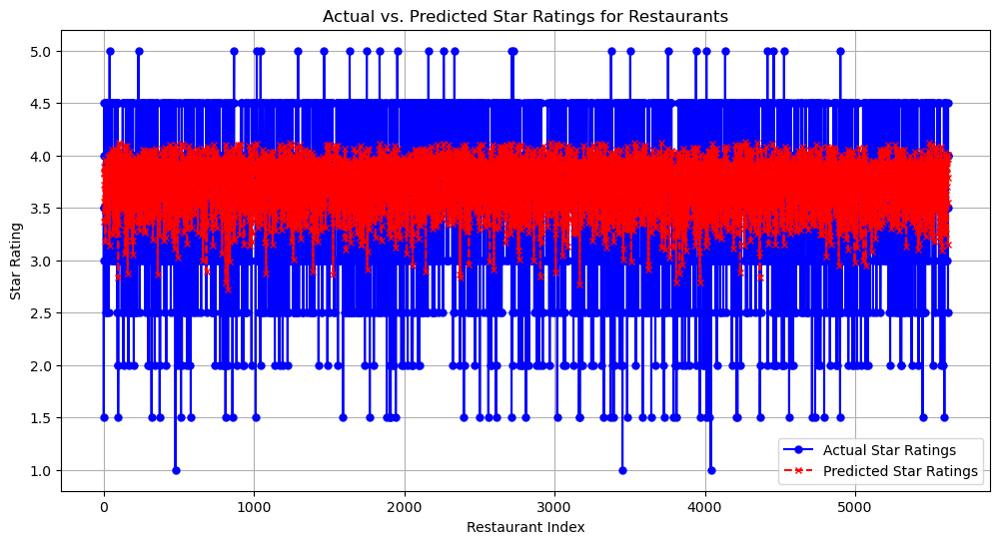

In [87]:
import matplotlib.pyplot as plt

# Ensure y_test is a numpy array for consistency
actual_stars = y_test.to_numpy()

# Flatten y_pred to ensure it has the same shape as actual_stars
predicted_stars = y_pred.flatten()

# Plotting
plt.figure(figsize=(12, 6))  # Set the figure size for clarity
plt.plot(actual_stars, label='Actual Star Ratings', color='blue', marker='o', linestyle='-', markersize=5)
plt.plot(predicted_stars, label='Predicted Star Ratings', color='red', marker='x', linestyle='--', markersize=5)
plt.title('Actual vs. Predicted Star Ratings for Restaurants')
plt.xlabel('Restaurant Index')
plt.ylabel('Star Rating')
plt.legend()
plt.grid(True)
plt.show()

## 7. MLP - Content based filtering 

In [94]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, Input
from tensorflow.keras.callbacks import Callback  # Import the Callback class

# Define a custom callback to print the loss and mae for each epoch
class EpochDetailPrinter(Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        print(f"Epoch {epoch + 1}/20 - loss: {logs.get('loss'):.4f}, mae: {logs.get('mae'):.4f}, val_loss: {logs.get('val_loss'):.4f}, val_mae: {logs.get('val_mae'):.4f}")

# Load the dataset
file_path = 'pa_restaurants2.csv'
df = pd.read_csv(file_path)

# Data Preparation
features = ['latitude', 'longitude', 'review_count', 'is_open']
target = 'stars'  # Assuming 'stars' is the user rating for simplicity

X = df[features]
y = df[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the MLP model with specified hyperparameters
model = Sequential()
model.add(Input(shape=(X_train_scaled.shape[1],)))
model.add(Dense(128, activation='relu'))  # First layer with 128 units and relu activation
model.add(Dense(384, activation='tanh'))  # Second layer with 384 units and tanh activation
model.add(Dense(192))  # 192 units without activation
model.add(LeakyReLU(alpha=0.01))  # LeakyReLU as a separate layer to specify alpha
model.add(Dense(1))  # Output layer for rating prediction

# Compile the model with adam optimizer and mean squared error loss
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train the model with the custom callback
model.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0, callbacks=[EpochDetailPrinter()])

# Evaluate the model
loss, mae = model.evaluate(X_test_scaled, y_test, verbose=1)
print(f"Test MAE: {mae:.4f}")

# Predict ratings for the test set
predicted_ratings = model.predict(X_test_scaled)

# Select a sample from the test set to analyze
sample_index = 0
sample_input = X_test_scaled[sample_index:sample_index + 1]
sample_target = y_test.iloc[sample_index:sample_index + 1]

# Compute the gradients of the model's predictions with respect to the weights for the selected sample
with tf.GradientTape() as tape:
    # Make a prediction for the selected sample
    sample_prediction = model(sample_input, training=False)
    # Calculate the loss based on the model's prediction and the actual target value
    sample_loss = tf.keras.losses.mean_squared_error(sample_target, sample_prediction)

# Get the gradients of the loss with respect to the model's weights
gradients = tape.gradient(sample_loss, model.trainable_variables)

C:\Users\yunus\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Epoch 1/20 - loss: 0.5427, mae: 0.5372, val_loss: 0.3724, val_mae: 0.4698
Epoch 2/20 - loss: 0.3804, mae: 0.4770, val_loss: 0.3698, val_mae: 0.4641
Epoch 3/20 - loss: 0.3781, mae: 0.4759, val_loss: 0.3635, val_mae: 0.4637
Epoch 4/20 - loss: 0.3786, mae: 0.4771, val_loss: 0.3922, val_mae: 0.4998
Epoch 5/20 - loss: 0.3761, mae: 0.4753, val_loss: 0.3769, val_mae: 0.4861
Epoch 6/20 - loss: 0.3730, mae: 0.4726, val_loss: 0.3701, val_mae: 0.4631
Epoch 7/20 - loss: 0.3669, mae: 0.4677, val_loss: 0.3601, val_mae: 0.4634
Epoch 8/20 - loss: 0.3621, mae: 0.4651, val_loss: 0.3813, val_mae: 0.4713
Epoch 9/20 - loss: 0.3661, mae: 0.4682, val_loss: 0.3661, val_mae: 0.4584
Epoch 10/20 - loss: 0.3646, mae: 0.4667, val_loss: 0.3568, val_mae: 0.4593
Epoch 11/20 - loss: 0.3636, mae: 0.4665, val_loss: 0.3742, val_mae: 0.4835
Epoch 12/20 - loss: 0.3612, mae: 0.4639, val_loss: 0.3551, val_mae: 0.4589
Epoch 13/20 - loss: 0.3598, mae: 0.4638, val_loss: 0.3642, val_mae: 0.4747
Epoch 14/20 - loss: 0.3605, mae: 0

7.1 Results

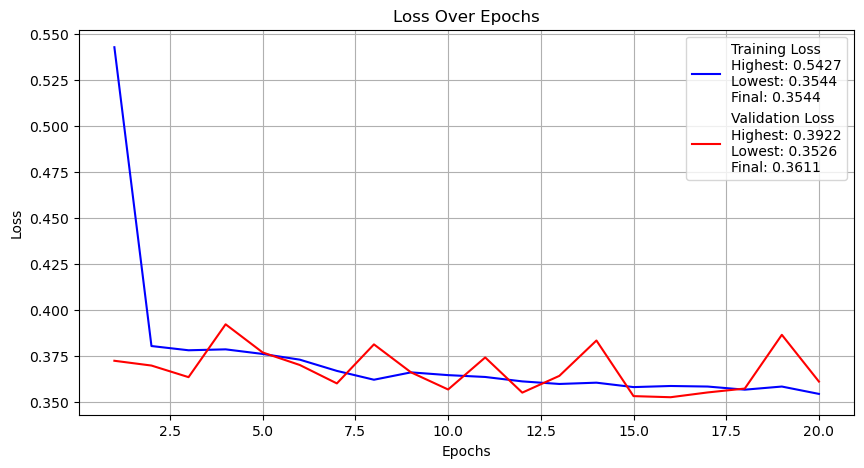

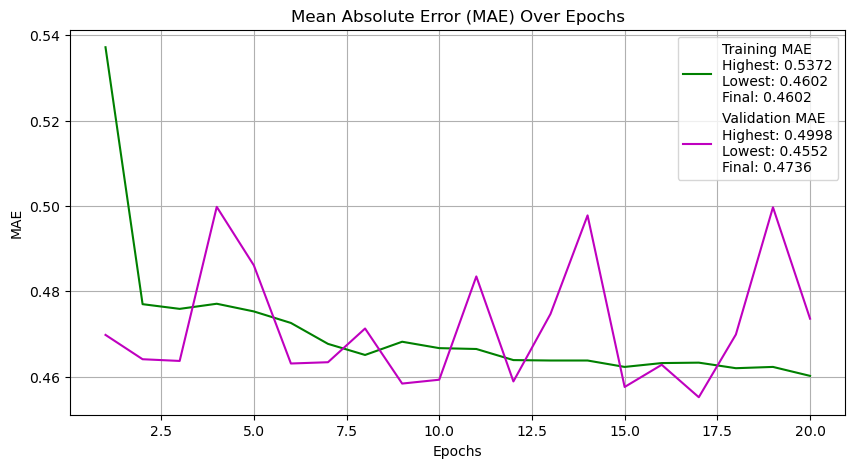

In [95]:
import matplotlib.pyplot as plt

# Provided epoch-wise loss and MAE values
epochs = range(1, 21)
training_loss = [
    0.5427, 0.3804, 0.3781, 0.3786, 0.3761, 0.3730, 0.3669, 0.3621, 
    0.3661, 0.3646, 0.3636, 0.3612, 0.3598, 0.3605, 0.3581, 0.3587, 
    0.3584, 0.3567, 0.3584, 0.3544
]
validation_loss = [
    0.3724, 0.3698, 0.3635, 0.3922, 0.3769, 0.3701, 0.3601, 0.3813, 
    0.3661, 0.3568, 0.3742, 0.3551, 0.3642, 0.3834, 0.3532, 0.3526, 
    0.3552, 0.3573, 0.3865, 0.3611
]
training_mae = [
    0.5372, 0.4770, 0.4759, 0.4771, 0.4753, 0.4726, 0.4677, 0.4651, 
    0.4682, 0.4667, 0.4665, 0.4639, 0.4638, 0.4638, 0.4623, 0.4632, 
    0.4633, 0.4620, 0.4623, 0.4602
]
validation_mae = [
    0.4698, 0.4641, 0.4637, 0.4998, 0.4861, 0.4631, 0.4634, 0.4713, 
    0.4584, 0.4593, 0.4835, 0.4589, 0.4747, 0.4978, 0.4576, 0.4628, 
    0.4552, 0.4699, 0.4997, 0.4736
]

# Find highest, lowest, and final values for both loss and MAE
def get_highest_lowest_final(data):
    return max(data), min(data), data[-1]

highest_training_loss, lowest_training_loss, final_training_loss = get_highest_lowest_final(training_loss)
highest_validation_loss, lowest_validation_loss, final_validation_loss = get_highest_lowest_final(validation_loss)
highest_training_mae, lowest_training_mae, final_training_mae = get_highest_lowest_final(training_mae)
highest_validation_mae, lowest_validation_mae, final_validation_mae = get_highest_lowest_final(validation_mae)

# Loss Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_loss, 'b', label=f'Training Loss\nHighest: {highest_training_loss:.4f}\nLowest: {lowest_training_loss:.4f}\nFinal: {final_training_loss:.4f}')
plt.plot(epochs, validation_loss, 'r', label=f'Validation Loss\nHighest: {highest_validation_loss:.4f}\nLowest: {lowest_validation_loss:.4f}\nFinal: {final_validation_loss:.4f}')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.grid(True)
plt.show()

# MAE Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, training_mae, 'g', label=f'Training MAE\nHighest: {highest_training_mae:.4f}\nLowest: {lowest_training_mae:.4f}\nFinal: {final_training_mae:.4f}')
plt.plot(epochs, validation_mae, 'm', label=f'Validation MAE\nHighest: {highest_validation_mae:.4f}\nLowest: {lowest_validation_mae:.4f}\nFinal: {final_validation_mae:.4f}')
plt.title('Mean Absolute Error (MAE) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.grid(True)
plt.show()

7.2 Backpropegation: absolute Gradient descent for each layer & bias

In [ ]:
# Examine the gradients to assess the influence of the weights
for i, layer_gradients in enumerate(gradients):
    # Calculate the average absolute gradient for each layer
    average_gradient = tf.reduce_mean(tf.abs(layer_gradients)).numpy()
    print(f"Layer {i} average absolute gradient: {average_gradient}")

Layer 0 average absolute gradient: 0.011597338132560253
Layer 1 average absolute gradient: 0.0317232683300972
Layer 2 average absolute gradient: 0.00010721025319071487
Layer 3 average absolute gradient: 0.012383011169731617
Layer 4 average absolute gradient: 0.0001760419545462355
Layer 5 average absolute gradient: 0.005246350076049566
Layer 6 average absolute gradient: 0.03437189757823944
Layer 7 average absolute gradient: 0.20886468887329102


- Layer 0: Gradients for the weights of the first Dense layer (128 neurons with ReLU activation).
- Layer 1: Gradients for the biases of the first Dense layer.
- Layer 2: Gradients for the weights of the second Dense layer (384 neurons with tanh activation).
- Layer 3: Gradients for the biases of the second Dense layer.
- Layer 4: Gradients for the weights of the third Dense layer (192 neurons, no activation specified before the LeakyReLU).
- Layer 5: Gradients for the biases of the third Dense layer.
- Layer 6: Gradients for the weights of the output layer (1 neuron, linear activation).
- Layer 7: Gradients for the biases of the output layer.

These gradient layers correspond to both the weights and biases of the respective layers of neurons within the model. Typically, each Dense layer has two sets of parameters: weights and biases, hence why we have double the number of gradient readings as we do actual Dense layers. Each Dense layer contributes two readings: one for the weights and one for the biases.

The reason seeing 8 layers instead of 6 (as might be expected from the model definition) is that Keras calculates and tracks gradients for both weights and biases separately for each dense layer. 

In [ ]:
# Assuming df includes 'user_id' and 'business_id' along with features

# Split data while retaining identifiers
identifiers = ['user_id', 'business_id']
features = ['latitude', 'longitude', 'text_numeric_vectorization']
X = df[identifiers + features]
y = df['stars']

# Split the data, ensuring identifiers are retained
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Prepare features for model training and prediction
X_train_features = X_train[features]
X_test_features = X_test[features]

# Normalize features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_features)
X_test_scaled = scaler.transform(X_test_features)

# Associate predictions with test set identifiers
X_test_with_predictions = X_test[identifiers].copy()
X_test_with_predictions['predicted_rating'] = predicted_ratings.flatten()

# Now you can filter and generate recommendations based on these predictions
# Ensure you filter out restaurants the user has already rated if necessary

7.3 Results

In [ ]:
import numpy as np

# Randomly select a user_id from the test set
random_user_id = np.random.choice(X_test_with_predictions['user_id'].unique())

# Filter predictions for the randomly selected user
user_predictions = X_test_with_predictions[X_test_with_predictions['user_id'] == random_user_id]

# Merge 'user_predictions' with the original dataset to include the 'name' column
user_predictions_with_names = user_predictions.merge(df[['business_id', 'name']], on='business_id', how='left')

# Deduplicate by taking the highest predicted rating for each unique business_id
deduped_recommendations = user_predictions_with_names.sort_values(by='predicted_rating', ascending=False).drop_duplicates('business_id')

# Take the top 5 recommendations
top_recommendations = deduped_recommendations.head(5)

# Manually add 'user_id' back to the DataFrame
top_recommendations['user_id'] = random_user_id

# Display the top 5 recommendations for the randomly selected user
top_recommendations[['user_id', 'business_id', 'name', 'predicted_rating']]

,user_id,business_id,name,predicted_rating
0,PMw4YqOZ4AwesADDmaIVsw,4J06--ty2Ydj1---IsArLw,Cantina Los Caballitos,3.646389


## 8. Fast Influence Analysis (FIA) combined with ACCENT algorithm for generating counterfactuals

In [ ]:
import numpy as np
import tensorflow as tf

def compute_gradient(model, inputs, outputs):
    """Compute the gradient of the loss with respect to model parameters."""
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        loss = tf.keras.losses.mean_squared_error(outputs, predictions)
    return tape.gradient(loss, model.trainable_variables)

def estimate_influence_on_loss(model, train_data, train_labels, test_data, test_label):
    """Estimate the influence of each training data point on the loss of a test data point."""
    # Compute the gradient of the test loss with respect to model parameters
    test_grad = compute_gradient(model, test_data, test_label)

    influences = []
    for i in range(len(train_data)):
        # Compute the gradient of the train loss with respect to model parameters for one data point
        train_grad = compute_gradient(model, train_data[i:i+1], train_labels[i:i+1])

        # Approximate the influence of this training point on the test loss
        influence = sum([(tf.reduce_sum(tf.multiply(t_grad, tr_grad)).numpy()) for t_grad, tr_grad in zip(test_grad, train_grad)])
        influences.append(influence)

    return influences  

influences = estimate_influence_on_loss(model, X_train_scaled, y_train.values, sample_input, sample_target)
 
def accent(model, target_instance, train_data, train_labels, loss_threshold=0.01, learning_rate=0.1, num_iterations=100):
    """Accelerated Counterfactual Learning (ACCENT) to generate counterfactuals."""
    # Initialize the counterfactual as a copy of the target instance
    counterfactual = tf.Variable(target_instance, dtype=tf.float32)
    
    # Perform gradient ascent to minimize the loss
    for i in range(num_iterations):
        # Compute the gradient of the loss with respect to the counterfactual
        with tf.GradientTape() as tape:
            predictions = model(tf.reshape(counterfactual, (1, -1)), training=False)
            loss = tf.keras.losses.mean_squared_error([target_instance], predictions)
        gradient = tape.gradient(loss, counterfactual)
        
        # Update the counterfactual using gradient ascent
        counterfactual.assign_add(learning_rate * gradient)
        
        # Clip counterfactual values to ensure they stay within valid ranges
        counterfactual.assign(tf.clip_by_value(counterfactual, 0, 1))
        
        # Stop if the loss is below the threshold
        if loss < loss_threshold:
            break
    
    return counterfactual.numpy()

# Select a specific example from your test set as the target instance
target_instance = sample_input  # Use sample_input as your target instance

# Generate the counterfactual using the ACCENT method
counterfactual = accent(model, target_instance, X_train_scaled, y_train.values)

# Convert counterfactual to a tf.Tensor
counterfactual_tensor = tf.convert_to_tensor(counterfactual, dtype=tf.float32)

Visualization

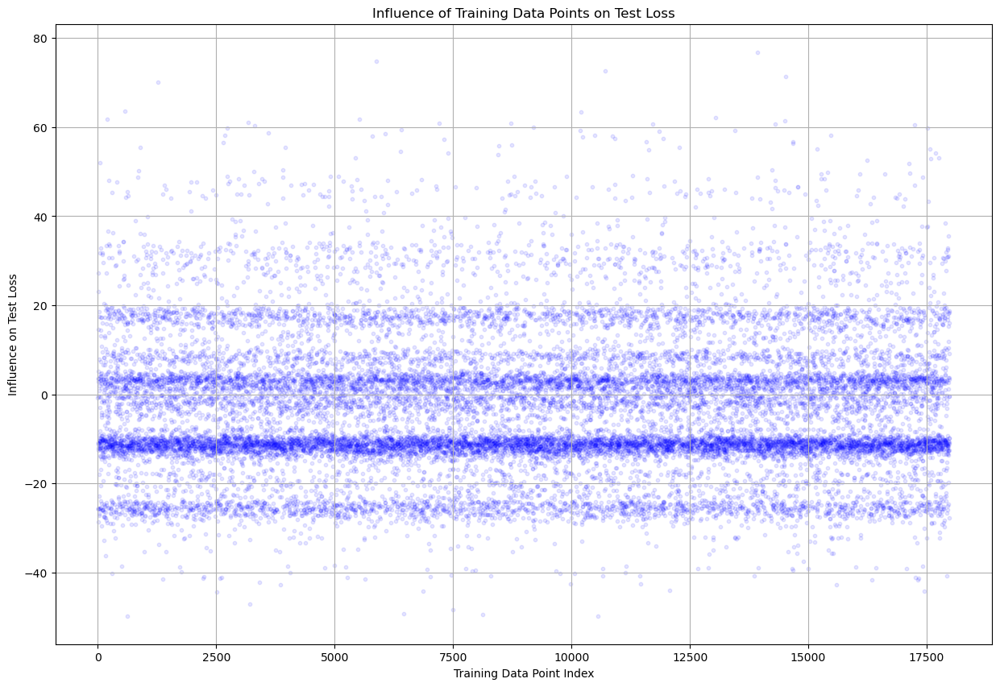

In [ ]:
# Define the number of data points to visualize (80% of the training data)
num_points = int(0.8 * len(influences))

# Generate a gradient of alphas for transparency effect
alphas = np.linspace(0.1, 1, num_points)

# Visualize FIA influence scores with a scatter plot
plt.figure(figsize=(15, 10))  # Adjust the size to match your desired output
plt.scatter(range(num_points), influences[:num_points], alpha=0.1, color='blue', s=10)  # Adjust the size 's' as needed
plt.xlabel('Training Data Point Index')
plt.ylabel('Influence on Test Loss')
plt.title('Influence of Training Data Points on Test Loss')
plt.grid(True)
plt.show()

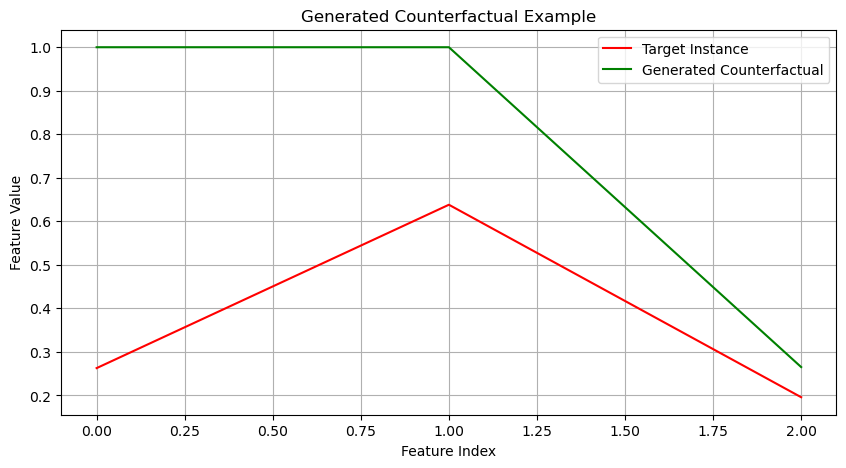

In [ ]:
import matplotlib.pyplot as plt

# Generate the counterfactual instance using ACCENT
counterfactual = accent(model, target_instance, X_train_scaled, y_train.values)

# Convert counterfactual to a tf.Tensor
counterfactual_tensor = tf.convert_to_tensor(counterfactual, dtype=tf.float32)

# Visualize the generated counterfactual instance
plt.figure(figsize=(10, 5))
plt.plot(target_instance[0], color='red', label='Target Instance')
plt.plot(counterfactual_tensor.numpy()[0], color='green', label='Generated Counterfactual')
plt.xlabel('Feature Index')
plt.ylabel('Feature Value')
plt.title('Generated Counterfactual Example')
plt.legend()
plt.grid(True)
plt.show()

8.1 Fast Influence Analysis (FIA)

In [ ]:
# def compute_gradient(model, inputs, outputs):
#    """Compute the gradient of the loss with respect to model parameters."""
#    with tf.GradientTape() as tape:
#        predictions = model(inputs, training=True)
#        loss = tf.keras.losses.mean_squared_error(outputs, predictions)
#    return tape.gradient(loss, model.trainable_variables)

# def estimate_influence_on_loss(model, train_data, train_labels, test_data, test_label):
#    """Estimate the influence of each training data point on the loss of a test data point."""
   # Compute the gradient of the test loss with respect to model parameters
#    test_grad = compute_gradient(model, test_data, test_label)
#
#    influences = []
#    for i in range(len(train_data)):
#        # Compute the gradient of the train loss with respect to model parameters for one data point
#        train_grad = compute_gradient(model, train_data[i:i+1], train_labels[i:i+1])
#
#        # Approximate the influence of this training point on the test loss
#        influence = sum([(tf.reduce_sum(tf.multiply(t_grad, tr_grad)).numpy()) for t_grad, tr_grad in zip(test_grad, train_grad)])
#        influences.append(influence)
#
#    return influences   
#
# Select a specific test data point to analyze
# test_index = 0  # You can choose a different index if you want to analyze a different test point
# test_data = X_test_scaled[test_index:test_index+1]
# test_label = y_test.values[test_index:test_index+1]
#
# Calculate the influences
# influences = estimate_influence_on_loss(model, X_train_scaled, y_train.values, test_data, test_label)
#
# 'influences' now contains the influence score of each training point on the selected test point

8.2 Visualization

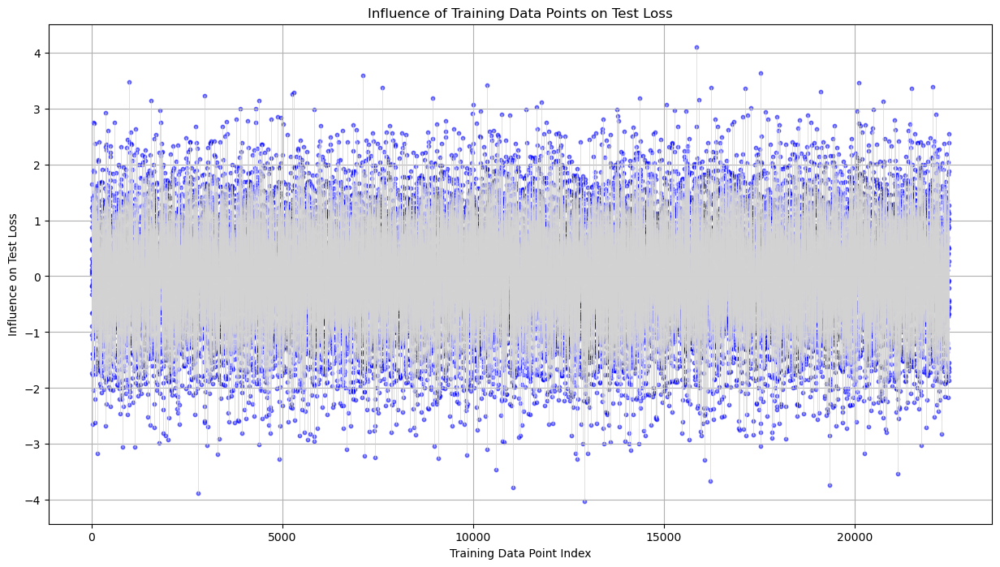

In [ ]:
# Calculate the number of training data points
# total_data_points = 28098
# training_data_points = int(total_data_points * 0.8)  # 80% of the total for the training set

# Simulating influence scores for the actual number of training data points
# actual_influences = np.random.randn(training_data_points)

# Visualization with light grey vertical lines for the actual influence scores
# plt.figure(figsize=(15, 8))
# plt.scatter(range(len(influences)), influences, alpha=0.5, s=10, color='blue')
# plt.vlines(range(len(influences)), [0], influences, color='lightgrey', lw=0.5)
# plt.title('Influence of Training Data Points on Test Loss')
# plt.xlabel('Training Data Point Index')
# plt.ylabel('Influence on Test Loss')
# plt.grid(True)
# plt.show()